In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('youtube_contents_info_final_runtime_update.csv', index_col=0)
df.head(2)

,channel,subscription,title_text,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,...,business_other,10,20,30,40,50,60,script,upload_year,upload_month
0,재친구,311000.0,[SUB] 인재 영입 준비 완료 Ep.55 | 휘인 김재중,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,...,0,0,1,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9
1,재친구,311000.0,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 Ep.54 | 아이콘 김재중,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,...,0,0,2,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9


## 제목, 스크립트를 feature로 활용하기 위한 전처리
1. 질문 개수: 게스트 초대 채널의 특성을 고려해 질문과 조회수 관계를 파악하기 위함
2. 제목과 스크립트간의 유사도: 제목과 실제 내용간의 유사도가 조회수에 얼마나 영향을 끼치는지 파악

- 한글이 남아있는 스크립트가 있어서 제거 필요

In [3]:
import re

# 한글 있는 여부 확인하는 함수
def contain_hangul(text):
    hangul_regex = re.compile('[\uac00-\ud7a3]+')
    hangul_script = hangul_regex.findall(text) # 한글로 인식된 부분

    if hangul_regex:
        return True, ' '.join(hangul_script)
    else:
        return False, None

h_script_dict = {}
for idx, script in enumerate(df['script']):
    is_hangul, hangul_script = contain_hangul(script)
    if is_hangul:
        # 공백 제거 후 한글이면 리스트에 넣음
        if hangul_script.strip():
            h_script_dict[idx] = hangul_script

h_script_dict

{15: '명',
 16: '딱 잡으면 누구 한 명이',
 20: '년 만에 재회한 하나와',
 22: '시작부터 매력 어필',
 47: '으로',
 49: '조곤조곤',
 336: '파리 년생 청춘사운드',
 337: '석진',
 338: '근데 여자가 마음에 들면',
 370: '핑계고 로 시작해서 무대 인사 너 근데 이따 더울걸 이따는',
 375: '갑자기 다급하게 고삼차 연하게 해달라고',
 377: '제작 안테나 플러스',
 378: '같이 떠든 사람 초 미리 보기',
 389: '아이 그럼 나 메뚜기 진짜 맛있지 옛날 과자가 맛있어 어 년대 후반이지',
 394: '아이 물론 볼 수 있지만',
 404: '다',
 483: '널 사랑하지',
 528: '이걸 위해 도쿄까지 왔는데',
 535: '혀 크게 한 번 돌리고',
 536: '잘못된 경로 선택에 시민분 당황'}

In [4]:
df = df.drop(list(h_script_dict.keys()))

- 한글있는 스크립트 제거됐는지 확인 및 인덱스 초기화

In [5]:
def contain_hangul(text):
    hangul_regex = re.compile('[\uac00-\ud7a3]+')
    hangul_script = hangul_regex.findall(text) # 한글로 인식된 부분

    if hangul_regex:
        return True, ' '.join(hangul_script)
    else:
        return False, None

h_script_dict = {}
for idx, script in enumerate(df['script']):
    is_hangul, hangul_script = contain_hangul(script)
    if is_hangul:
        # 공백 제거 후 한글이면 리스트에 넣음
        if hangul_script.strip():
            h_script_dict[idx] = hangul_script

h_script_dict

{}

In [6]:
df = df.reset_index(drop=True)
df

,channel,subscription,title_text,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,...,business_other,10,20,30,40,50,60,script,upload_year,upload_month
0,재친구,311000.0,[SUB] 인재 영입 준비 완료 Ep.55 | 휘인 김재중,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,...,0,0,1,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9
1,재친구,311000.0,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 Ep.54 | 아이콘 김재중,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,...,0,0,2,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9
2,재친구,311000.0,[SUB] 신데렐라만 3번째 경력직 재벌 여친 Ep.53 | 신현빈 김재중,"['#새벽2시의신데렐라', '#金在中', '#신현빈', '#신현빈', '#새벽2시의...",5200,256904,2024-09-14,389,1661,신현빈,...,0,0,0,1,0,0,0,"['Hello, Jaefriends!', 'Hello.', 'Hello...?', ...",2024,9
3,재친구,311000.0,[SUB] 순도 100% 무해함 바른생활 막내의 모든 것 | 재친구 Ep.52 | ...,"['#TZUYU', '#金在中', '#Jaejoong', '#쯔위', '#어바웃쯔'...",32000,607036,2024-09-12,1581,1828,"쯔위, 김재중",...,0,0,1,0,0,0,0,"[""I want to ask this since you're an adult. Ha...",2024,9
4,재친구,311000.0,[SUB] 데뷔 13년차 I 모먼트의 아이돌 비투비 | 재친구 Ep.51 | 비투비...,"['#limhyunsik', '#민혁', '#金在中', '#민혁', '#현식', '...",14000,285835,2024-09-05,654,1572,"비투비, 김재중",...,0,0,0,2,0,0,0,"['Then to MELODY fans, HYUNSIK,', ""show them l...",2024,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,살롱드립,1120000.0,[SUB] 오늘부터 1일? | EP.5 원지&채코제 | 살롱드립?,"['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",15000,730772,2023-06-20,844,1310,"채코제,원지",...,0,0,0,2,0,0,0,"['A man who wants world peace', 'But', 'a woma...",2023,6
537,살롱드립,1120000.0,[SUB] 범죄도시 4(나오면) 장도연 출연 성사 되나요? | EP.4 장항준&장원...,"['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",4700,294526,2023-06-13,166,1443,"장항준, 장원석",...,1,0,0,0,1,1,0,['[Bad rumors(?) in the drama industry]\n- I h...,2023,6
538,살롱드립,1120000.0,"[SUB] 언제 졸업하세요? | EP.3 여고추리반 박지윤, 재재, 비비, 최예나 ...","['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",17000,793769,2023-06-06,761,1195,"여고추리반 시리즈(박지윤,재재,BIBI,최예나)",...,0,0,2,1,1,0,0,"['Can you scout the member I want?', 'Is there...",2023,6
539,살롱드립,1120000.0,"[SUB] 차, 정숙하게 한 잔 할래요? | EP.2 엄정화 | 살롱드립?","['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",11000,518195,2023-05-30,359,1305,엄정화,...,0,0,0,0,0,1,0,"['[Sad]', ""When you're on a date,\nmake sure y...",2023,5


In [7]:
df.to_csv('youtube_contents_info_final_ver2.csv')

In [8]:
df = pd.read_csv('youtube_contents_info_final_ver2.csv', index_col=0)
df.head(2)

,channel,subscription,title_text,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,...,business_other,10,20,30,40,50,60,script,upload_year,upload_month
0,재친구,311000.0,[SUB] 인재 영입 준비 완료 Ep.55 | 휘인 김재중,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,...,0,0,1,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9
1,재친구,311000.0,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 Ep.54 | 아이콘 김재중,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,...,0,0,2,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9


#### 제목 수정 업데이트
- 제목 중 온전히 수집되지 않은 것들이 종종 보여 제목만 다시 크롤링후 병합
- 크롤링은 별도의 파일에서 따로 진행함

In [9]:
title_df = pd.read_csv('title_re_crawling.csv', index_col=0)
title_df.head(2)

,o_title,re_title
0,[SUB] 인재 영입 준비 완료 Ep.55 | 휘인 김재중,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중
1,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 Ep.54 | 아이콘 김재중,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 | 재친구 Ep.54 | 아이콘...


In [10]:
merge_df = df.merge(title_df, left_on='title_text', right_on='o_title', how='inner')
merge_df = merge_df.drop(columns=['title_text', 'o_title'])

In [11]:
merge_df = merge_df.rename(columns={'re_title': 'title_text'})

In [12]:
merge_df.head(2)

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,10,20,30,40,50,60,script,upload_year,upload_month,title_text
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,0,1,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중
1,재친구,311000.0,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,0,...,0,2,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 | 재친구 Ep.54 | 아이콘...


In [13]:
merge_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541 entries, 0 to 540
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   channel           541 non-null    object 
 1   subscription      541 non-null    float64
 2   hash_tag          541 non-null    object 
 3   likes             541 non-null    int64  
 4   views             541 non-null    int64  
 5   upload_date       541 non-null    object 
 6   comment_count     541 non-null    int64  
 7   running_times(s)  541 non-null    int64  
 8   guest             541 non-null    object 
 9   sex               541 non-null    int64  
 10  brand_power       541 non-null    object 
 11  entertainment     541 non-null    int64  
 12  actor             541 non-null    int64  
 13  comedian          541 non-null    int64  
 14  singer            541 non-null    int64  
 15  arts_creator      541 non-null    int64  
 16  sports            541 non-null    int64  
 1

In [14]:
merge_df.to_csv('youtube_contents_info_final_ver3.csv')

In [15]:
df = pd.read_csv('youtube_contents_info_final_ver3.csv', index_col=0)
df

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,10,20,30,40,50,60,script,upload_year,upload_month,title_text
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,0,1,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중
1,재친구,311000.0,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,0,...,0,2,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 | 재친구 Ep.54 | 아이콘...
2,재친구,311000.0,"['#새벽2시의신데렐라', '#金在中', '#신현빈', '#신현빈', '#새벽2시의...",5200,256904,2024-09-14,389,1661,신현빈,1,...,0,0,1,0,0,0,"['Hello, Jaefriends!', 'Hello.', 'Hello...?', ...",2024,9,[SUB] 신데렐라만 3번째 경력직 재벌 여친 | 재친구 Ep.53 | 신현빈 김재중
3,재친구,311000.0,"['#TZUYU', '#金在中', '#Jaejoong', '#쯔위', '#어바웃쯔'...",32000,607036,2024-09-12,1581,1828,"쯔위, 김재중",1,...,0,1,0,0,0,0,"[""I want to ask this since you're an adult. Ha...",2024,9,[SUB] 순도 100% 무해함 바른생활 막내의 모든 것 | 재친구 Ep.52 | ...
4,재친구,311000.0,"['#limhyunsik', '#민혁', '#金在中', '#민혁', '#현식', '...",14000,285835,2024-09-05,654,1572,"비투비, 김재중",0,...,0,0,2,0,0,0,"['Then to MELODY fans, HYUNSIK,', ""show them l...",2024,9,[SUB] 데뷔 13년차 I 모먼트의 아이돌 비투비 | 재친구 Ep.51 | 비투비...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,살롱드립,1120000.0,"['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",15000,730772,2023-06-20,844,1310,"채코제,원지",2,...,0,0,2,0,0,0,"['A man who wants world peace', 'But', 'a woma...",2023,6,[SUB] 오늘부터 1일? | EP.5 원지&채코제 | 살롱드립☕
537,살롱드립,1120000.0,"['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",4700,294526,2023-06-13,166,1443,"장항준, 장원석",0,...,0,0,0,1,1,0,['[Bad rumors(?) in the drama industry]\n- I h...,2023,6,[SUB] 범죄도시 4(나오면) 장도연 출연 성사 되나요? | EP.4 장항준&장원...
538,살롱드립,1120000.0,"['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",17000,793769,2023-06-06,761,1195,"여고추리반 시리즈(박지윤,재재,BIBI,최예나)",1,...,0,2,1,1,0,0,"['Can you scout the member I want?', 'Is there...",2023,6,"[SUB] 언제 졸업하세요? | EP.3 여고추리반 박지윤, 재재, 비비, 최예나 ..."
539,살롱드립,1120000.0,"['#살롱드립', '#SalonDrip', '#장도연', '#TEO', '#테오',...",11000,518195,2023-05-30,359,1305,엄정화,1,...,0,0,0,0,1,0,"['[Sad]', ""When you're on a date,\nmake sure y...",2023,5,"[SUB] 차, 정숙하게 한 잔 할래요? | EP.2 엄정화 | 살롱드립☕"


### 1. 질문 개수 컬럼 만들기

In [16]:
df['script']

0      ['And also Jaejoong...', '- This is so weird.\...
1      ['Junhoe told people around him', 'that Yunhye...
2      ['Hello, Jaefriends!', 'Hello.', 'Hello...?', ...
3      ["I want to ask this since you're an adult. Ha...
4      ['Then to MELODY fans, HYUNSIK,', "show them l...
                             ...                        
536    ['A man who wants world peace', 'But', 'a woma...
537    ['[Bad rumors(?) in the drama industry]\n- I h...
538    ['Can you scout the member I want?', 'Is there...
539    ['[Sad]', "When you're on a date,\nmake sure y...
540    ["Whether you're a man", 'or an alien...', "I ...
Name: script, Length: 541, dtype: object

In [17]:
for script in df['script']:
    script
print(type(script), script)

<class 'str'> ["Whether you're a man", 'or an alien...', "I don't care anymore", "Let's see where this leads us", "You're not joking, right?", 'To be honest...', 'You can open your eyes', "I'm not going to", 'Open them!', 'If you want to keep filming this', 'open them!', 'Open them and look at this!', 'What?', 'What is that?', '[Salon Drip]', 'Salon Drip', '[Hello]\nBonjour', '[Thank you]\nSpasibo', 'Welcome to Salon Drip', 'Here we are rudely polite', 'impolitely kind', 'and we stay composed, like royalty', '[Quite a posh set]', 'As you can see, at Salon Drip', 'we gather for tea', 'and maintain seriousness and elegance', "[Salon Drip / Today's tea]\nAllow me to make some tea for today", 'Chrysanthemum tea', "I'm nervous now", '[An elegant social gathering\nthat will likely grow with time]', '[Salon Drip]\nI always start my day\nwith a cup of tea, like this', 'And to infuse the tea well', 'One', 'two', 'three', 'One', 'two', 'three', 'I keep going back and forth\nwith English and Kore

In [18]:
import re
question_cnt_temp=[]

for script in df['script']:
    count=0
    sentences = re.findall(r'.*?\?', script)
    #print(len(sentences))    
    for sentence in sentences:
        print(sentence)

['And also Jaejoong...', '- This is so weird.\n- Why?
', 'Because I wanted to see Jaejoong...', 'When else would I get to see you\nif not for this opportunity?
', 'Right.', "- When do you get to call me Jaejoong?
\n- Yeah, that's true.", 'Sorry for bringing this up so late.', 'But in the history of "Jaefriends,"', "you're the first one who called me\nJaejoong from start to finish.", 'Oh?
 What do others call you then?
', 'Usually, they call me "oppa."', 'Or if they don\'t like "oppa,"\nthen "sunbae" (senior)...', "That's how it usually goes.", 'Oh, really?
', 'I thought it was like a total\nsame-age friend mode...', 'Your reaction was so entertaining that\nI wanted to see it through to the end.', 'And you did really well till the end, haha.', 'It was great.', 'Hello, Jaefriends.', 'Hello.', 'Hello!', 'Hello.', 'Jaefriends has started.', "Today's menu is really my style!", "It's soft tofu egg soup.", "Did today's guest... drink last night?
", 'This is kind of, you know!', "It's hangover

In [19]:
import re
question_cnt=[]

for script in df['script']:
    count=0
    sentences = re.findall(r'.*?\?', script)
    # print(len(sentences))    
    for sentence in sentences:
        # print(sentence)

        if 'you' in sentence.lower() and '?' in sentence:
                    count += 1
    question_cnt.append(count)

question_cnt
df['question_count'] = question_cnt
df.head(2)

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,20,30,40,50,60,script,upload_year,upload_month,title_text,question_count
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,1,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중,98
1,재친구,311000.0,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,0,...,2,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 | 재친구 Ep.54 | 아이콘...,77


In [20]:
# 분당 질문 개수
df['questions_per_minute'] = round(df['question_count']/df['running_times(s)'] * 60, 1)
df.head(2)

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,30,40,50,60,script,upload_year,upload_month,title_text,question_count,questions_per_minute
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,0,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중,98,3.3
1,재친구,311000.0,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,0,...,0,0,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 | 재친구 Ep.54 | 아이콘...,77,2.7


### 2. 제목과 스크립트간의 유사도
- 제목 영어로 번역 후 진행

In [55]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from konlpy.tag import Okt

In [227]:
# !pip install deep_translator

In [22]:
df[df['title_text'].isna()]

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,30,40,50,60,script,upload_year,upload_month,title_text,question_count,questions_per_minute


In [23]:
from deep_translator import GoogleTranslator

translator = GoogleTranslator(src='ko', target='en')

df['title_text_en'] = df['title_text'].apply(lambda x: translator.translate(x))

In [24]:
df.head(1)

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,40,50,60,script,upload_year,upload_month,title_text,question_count,questions_per_minute,title_text_en
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,0,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중,98,3.3,[SUB] Preparation for recruiting talent | Jaec...


In [25]:
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(df['title_text_en'].tolist() + df['script'].tolist()) # 밑에 유사도 비교 함수 만들어 둬서 필요 없음.

# 유사도 비교 함수
# 벡터의 크기와 상관없이 방향성만 비교하므로 코사인 유사도 사용함.
def cal_similarity(df):
    title_vec = tfidf.transform([df['title_text_en']])
    script_vec = tfidf.transform([df['script']])
    score = cosine_similarity(title_vec, script_vec)[0][0]
    
    return score

# axis=1 행 단위로 함수 적용
related_score = df.apply(cal_similarity, axis=1)

In [26]:
df['title_script_related'] = related_score

In [27]:
df.head(1)

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,50,60,script,upload_year,upload_month,title_text,question_count,questions_per_minute,title_text_en,title_script_related
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중,98,3.3,[SUB] Preparation for recruiting talent | Jaec...,0.036409


In [28]:
df.to_csv('youtube_contents_info_final_forEDA.csv')

In [2]:
contents_df = pd.read_csv('youtube_contents_info_final_forEDA.csv', index_col=0)
contents_df.head(2)

,channel,subscription,hash_tag,likes,views,upload_date,comment_count,running_times(s),guest,sex,...,50,60,script,upload_year,upload_month,title_text,question_count,questions_per_minute,title_text_en,title_script_related
0,재친구,311000.0,"['#휘인', '#金在中', '#Jaejoong', '#휘인', '#마마무', '#...",12000,235465,2024-09-26,824,1779,휘인,1,...,0,0,"['And also Jaejoong...', '- This is so weird.\...",2024,9,[SUB] 인재 영입 준비 완료 | 재친구 Ep.55 | 휘인 김재중,98,3.3,[SUB] Preparation for recruiting talent | Jaec...,0.036413
1,재친구,311000.0,"['#구준회', '#金在中', '#Jaejoong', '#송윤형', '#구준회', ...",11000,204109,2024-09-19,882,1729,아이콘,0,...,0,0,"['Junhoe told people around him', 'that Yunhye...",2024,9,[SUB] (군대) 먼저 가는 사람 아직 남은 사람 | 재친구 Ep.54 | 아이콘...,77,2.7,[SUB] (Army) The first person to go first | Ja...,0.090037


----

## 사용할 컬럼만 남겨두기

In [3]:
contents_df.columns

Index(['channel', 'subscription', 'hash_tag', 'likes', 'views', 'upload_date',
       'comment_count', 'running_times(s)', 'guest', 'sex', 'brand_power',
       'entertainment', 'actor', 'comedian', 'singer', 'arts_creator',
       'sports', 'media_production', 'business_other', '10', '20', '30', '40',
       '50', '60', 'script', 'upload_year', 'upload_month', 'title_text',
       'question_count', 'questions_per_minute', 'title_text_en',
       'title_script_related'],
      dtype='object')

In [3]:
sort_contents_df = contents_df[['channel', 'subscription', 'likes', 'views', 'upload_year', 'upload_month',
       'comment_count', 'running_times(s)', 'sex', 'brand_power',
       'entertainment', 'actor', 'comedian', 'singer', 'arts_creator',
       'sports', 'media_production', 'business_other', '10', '20', '30', '40',
       '50', '60', 'questions_per_minute', 'title_script_related']]

In [4]:
sort_contents_df.head(2)

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,media_production,business_other,10,20,30,40,50,60,questions_per_minute,title_script_related
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,0,0,0,1,0,0,0,0,3.3,0.036413
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,0,0,0,2,0,0,0,0,2.7,0.090037


## 이상치 전처리

#### 조회수 이상치 여부 확인
- 조회수 이상치 확인 및 제거

In [5]:
from matplotlib import font_manager, rc
import matplotlib.pyplot as plt

font_path = "C:/Windows/Fonts/malgun.ttf"  # Windows에서 사용할 수 있는 한글 폰트 경로
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

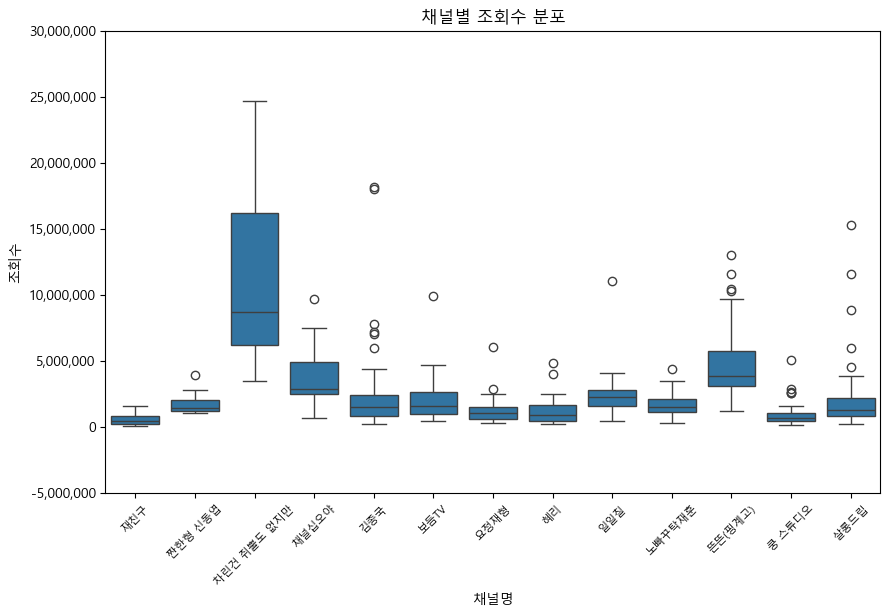

In [6]:
plt.figure(figsize=(10,6))
sns.boxplot(sort_contents_df, x='channel', y='views')
plt.ticklabel_format(style='plain', axis='y')
plt.title('채널별 조회수 분포')
plt.xlabel('채널명')
plt.ylabel('조회수')
plt.xticks(rotation=45, fontsize=8)
current_values = plt.gca().get_yticks() # .gca(): 현재 활성화된 축
plt.gca().set_yticks(current_values) # y축 눈금 설정
plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])
# plt.yticks(current_values, [f"{int(y/1_000_000)}" for y in current_values])
plt.show()

# 이상치가 생각보다 많아보임 -> z_score로 이상치 범위를 좀더 좁혀야겠다.

In [7]:
# z-score 확인
# z_socre 값이 -3 ~ 3 이외의 범위에 있는 값은 99.7% 이외의 값이므로 이상치로 여김
# .transform(): 그룹화된 데이터에 대한 연산
sort_contents_df['z_score'] = sort_contents_df.groupby('channel')['views'].transform(lambda x: (x - x.mean()) / x.std())
sort_contents_df['z_score']

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_24220\2143107428.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sort_contents_df['z_score'] = sort_contents_df.groupby('channel')['views'].transform(lambda x: (x - x.mean()) / x.std())


0     -0.783610
1     -0.863153
2     -0.729224
3      0.158982
4     -0.655833
         ...   
536   -0.520656
537   -0.697621
538   -0.495101
539   -0.606889
540    0.754509
Name: z_score, Length: 541, dtype: float64

c:\Users\Paris\miniconda3\envs\ds_study\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


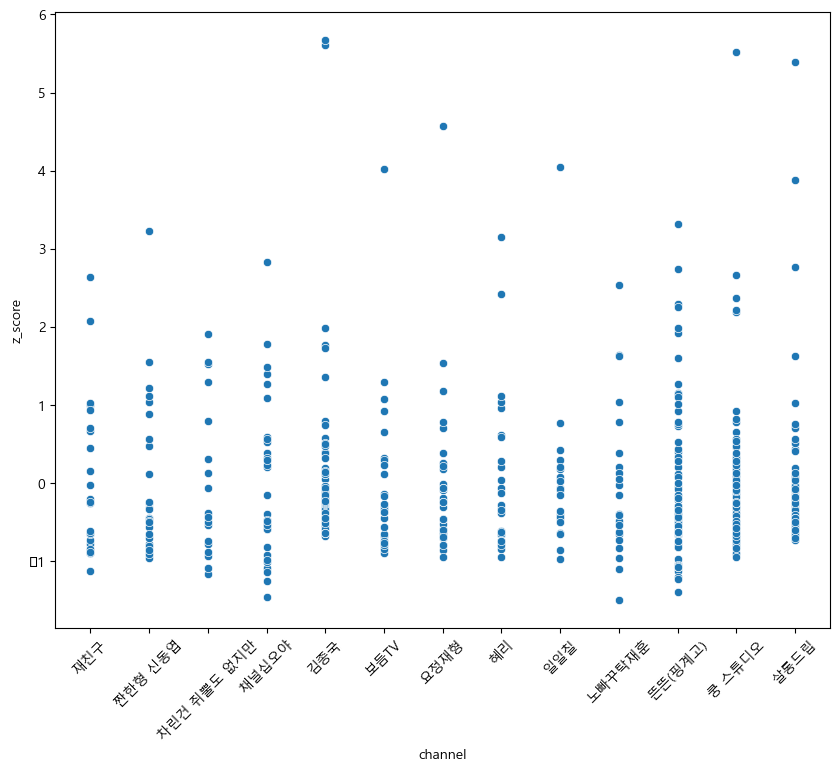

In [8]:
plt.figure(figsize=(10,8))
sns.scatterplot(sort_contents_df, x='channel', y='z_score')
plt.xticks(rotation=45)
plt.show()

# z-score를 확인해보니 모든 영상 대비 압도적으로 높은 조회수를 가진 2번 채널 소속 영상이 오히려 해당 채널 대비 이상치가 아니라는 결론이 나옴.

In [9]:
sort_contents_df = sort_contents_df[~(sort_contents_df['z_score'] > 3)]
sort_contents_df = sort_contents_df.reset_index(drop=True)

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_24220\1418650567.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])


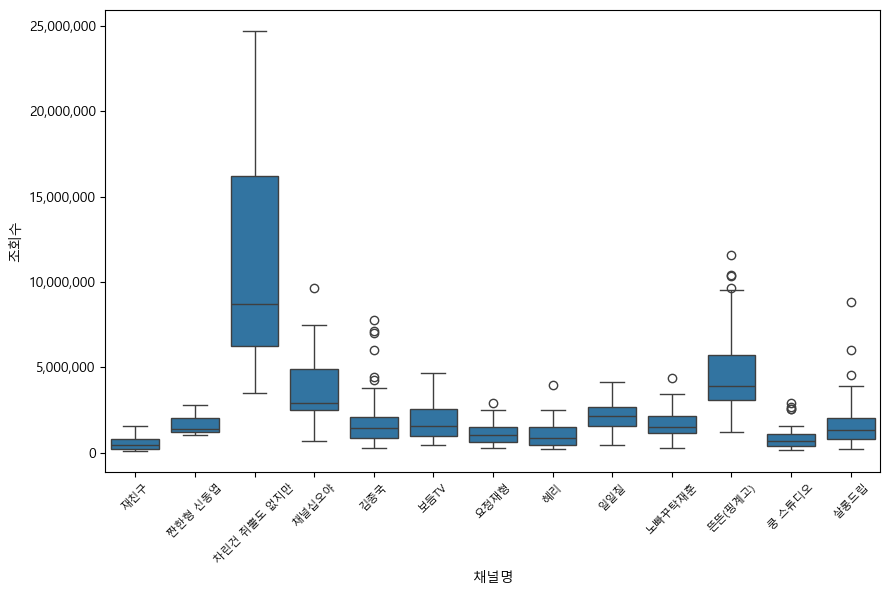

In [68]:
plt.figure(figsize=(10,6))
sns.boxplot(sort_contents_df, x='channel', y='views')
plt.ticklabel_format(style='plain', axis='y')
# plt.title('채널별 조회수')
plt.xlabel('채널명')
plt.ylabel('조회수')
plt.xticks(rotation=45, fontsize=8)
current_values = plt.gca().get_yticks() # .gca(): 현재 활성화된 축
# plt.gca().set_yticks(current_values) # y축 눈금 설정
plt.gca().set_yticklabels(['{:,.0f}'.format(x) for x in current_values])
plt.show()

#### 채널간 공정 비교를 위한 조회수, 좋아요수, 댓글수 표준화
- 채널별 조회수 성과를 비교하기 위해 '조회수/채널별 최대조회수' 컬럼 생성
- 해당 컬럼을 '조회수 성과 지표'라고 부름
- '좋아요수/조회수' 컬럼 생성
- '댓글수/조회수' 컬럼 생성

In [69]:
# 조회수
sort_contents_df['views/ch_max_view'] = sort_contents_df.groupby('channel')['views'].transform(lambda x: x/max(x))

In [70]:
sort_contents_df.head(2)

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,10,20,30,40,50,60,questions_per_minute,title_script_related,z_score,views/ch_max_view
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,0,1,0,0,0,0,3.3,0.036413,-0.783610,0.148806
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,0,2,0,0,0,0,2.7,0.090037,-0.863153,0.128990


In [71]:
# 좋아요수
sort_contents_df['likes/views'] = sort_contents_df['likes'] / sort_contents_df['views']

In [72]:
# 댓글수
sort_contents_df['comment/views'] = sort_contents_df['comment_count'] / sort_contents_df['views']

In [73]:
sort_contents_df.head(5)

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,30,40,50,60,questions_per_minute,title_script_related,z_score,views/ch_max_view,likes/views,comment/views
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,0,0,0,0,3.3,0.036413,-0.783610,0.148806,0.050963,0.003499
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,0,0,0,0,2.7,0.090037,-0.863153,0.128990,0.053893,0.004321
2,재친구,311000.0,5200,256904,2024,9,389,1661,1,중,...,1,0,0,0,2.1,0.131204,-0.729224,0.162354,0.020241,0.001514
3,재친구,311000.0,32000,607036,2024,9,1581,1828,1,상,...,0,0,0,0,2.7,0.174963,0.158982,0.383626,0.052715,0.002604
4,재친구,311000.0,14000,285835,2024,9,654,1572,0,중,...,2,0,0,0,2.1,0.052299,-0.655833,0.180638,0.048979,0.002288


## 크기가 존재하지 않는 컬럼 원-핫 인코딩
- 크기를 학습하는 선형 모델 사용에서 성별과 같은 값을 단순 숫자로 표기하면 조회수를 예측할 때 숫자의 차이를 학습하게됨.

In [74]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder()

gender_encoder = encoder.fit_transform(sort_contents_df['sex'].values.reshape(-1,1)) # 차원 배열로 변환
gender_array = gender_encoder.toarray()

gender_df = pd.DataFrame(gender_array, columns=['man', 'woman', 'mix'])
contents_df_final = pd.concat([sort_contents_df, gender_df], axis=1)
contents_df_final.head(3)

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,60,questions_per_minute,title_script_related,z_score,views/ch_max_view,likes/views,comment/views,man,woman,mix
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,0,3.3,0.036413,-0.783610,0.148806,0.050963,0.003499,0.0,1.0,0.0
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,0,2.7,0.090037,-0.863153,0.128990,0.053893,0.004321,1.0,0.0,0.0
2,재친구,311000.0,5200,256904,2024,9,389,1661,1,중,...,0,2.1,0.131204,-0.729224,0.162354,0.020241,0.001514,0.0,1.0,0.0


----

## 시각화로 살펴보기

#### 상관관계 확인
- 조회수와 관련있는 20개의 컬럼 확인

In [75]:
from matplotlib import font_manager, rc

font_path = "C:/Windows/Fonts/malgun.ttf"  # Windows에서 사용할 수 있는 한글 폰트 경로
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

In [76]:
sort_contents_df_corr = contents_df_final.drop(columns=['channel', 'sex', 'likes', 'comment_count', 'z_score'])

In [77]:
sort_contents_df_corr

,subscription,views,upload_year,upload_month,running_times(s),brand_power,entertainment,actor,comedian,singer,...,50,60,questions_per_minute,title_script_related,views/ch_max_view,likes/views,comment/views,man,woman,mix
0,311000.0,235465,2024,9,1779,중,0,0,0,1,...,0,0,3.3,0.036413,0.148806,0.050963,0.003499,0.0,1.0,0.0
1,311000.0,204109,2024,9,1729,중,0,0,0,1,...,0,0,2.7,0.090037,0.128990,0.053893,0.004321,1.0,0.0,0.0
2,311000.0,256904,2024,9,1661,중,0,1,0,0,...,0,0,2.1,0.131204,0.162354,0.020241,0.001514,0.0,1.0,0.0
3,311000.0,607036,2024,9,1828,상,0,0,0,1,...,0,0,2.7,0.174963,0.383626,0.052715,0.002604,0.0,1.0,0.0
4,311000.0,285835,2024,9,1572,중,0,0,0,1,...,0,0,2.1,0.052299,0.180638,0.048979,0.002288,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525,1120000.0,730772,2023,6,1310,하,0,0,0,0,...,0,0,4.5,0.053971,0.082644,0.020526,0.001155,0.0,0.0,1.0
526,1120000.0,294526,2023,6,1443,중,0,0,0,0,...,1,0,3.1,0.214325,0.033309,0.015958,0.000564,1.0,0.0,0.0
527,1120000.0,793769,2023,6,1195,상,1,0,0,1,...,0,0,4.2,0.228266,0.089769,0.021417,0.000959,0.0,1.0,0.0
528,1120000.0,518195,2023,5,1305,중,0,0,0,1,...,1,0,3.0,0.190194,0.058604,0.021228,0.000693,0.0,1.0,0.0


In [78]:
# 상관관계 계산을 위한 brand_power 컬럼 숫자로 변환
sort_contents_df_corr['brand_power'] = sort_contents_df_corr['brand_power'].replace({'상': 2, '중': 1, '하': 0})
sort_contents_df_corr

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_24220\527760975.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sort_contents_df_corr['brand_power'] = sort_contents_df_corr['brand_power'].replace({'상': 2, '중': 1, '하': 0})


,subscription,views,upload_year,upload_month,running_times(s),brand_power,entertainment,actor,comedian,singer,...,50,60,questions_per_minute,title_script_related,views/ch_max_view,likes/views,comment/views,man,woman,mix
0,311000.0,235465,2024,9,1779,1,0,0,0,1,...,0,0,3.3,0.036413,0.148806,0.050963,0.003499,0.0,1.0,0.0
1,311000.0,204109,2024,9,1729,1,0,0,0,1,...,0,0,2.7,0.090037,0.128990,0.053893,0.004321,1.0,0.0,0.0
2,311000.0,256904,2024,9,1661,1,0,1,0,0,...,0,0,2.1,0.131204,0.162354,0.020241,0.001514,0.0,1.0,0.0
3,311000.0,607036,2024,9,1828,2,0,0,0,1,...,0,0,2.7,0.174963,0.383626,0.052715,0.002604,0.0,1.0,0.0
4,311000.0,285835,2024,9,1572,1,0,0,0,1,...,0,0,2.1,0.052299,0.180638,0.048979,0.002288,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525,1120000.0,730772,2023,6,1310,0,0,0,0,0,...,0,0,4.5,0.053971,0.082644,0.020526,0.001155,0.0,0.0,1.0
526,1120000.0,294526,2023,6,1443,1,0,0,0,0,...,1,0,3.1,0.214325,0.033309,0.015958,0.000564,1.0,0.0,0.0
527,1120000.0,793769,2023,6,1195,2,1,0,0,1,...,0,0,4.2,0.228266,0.089769,0.021417,0.000959,0.0,1.0,0.0
528,1120000.0,518195,2023,5,1305,1,0,0,0,1,...,1,0,3.0,0.190194,0.058604,0.021228,0.000693,0.0,1.0,0.0


In [79]:
corr = sort_contents_df_corr.corr()
views_corr = corr['views'].abs().sort_values(ascending=False)
top20_columns = views_corr.index[:21]
len(top20_columns), top20_columns

(21,
 Index(['views', 'views/ch_max_view', 'subscription', 'brand_power',
        'running_times(s)', 'questions_per_minute', 'comedian', 'upload_year',
        'comment/views', '50', 'title_script_related', '40', '20', 'mix',
        'arts_creator', 'entertainment', 'actor', '30', 'sports',
        'media_production', 'man'],
       dtype='object'))

In [80]:
top20_corr = corr.loc[top20_columns, top20_columns]

In [81]:
top20_corr['views'].round(2)

views                   1.00
views/ch_max_view       0.59
subscription            0.37
brand_power             0.28
running_times(s)        0.26
questions_per_minute    0.19
comedian                0.19
upload_year            -0.17
comment/views          -0.16
50                      0.12
title_script_related   -0.11
40                      0.10
20                      0.08
mix                     0.07
arts_creator           -0.07
entertainment           0.06
actor                   0.05
30                     -0.05
sports                 -0.05
media_production        0.05
man                    -0.04
Name: views, dtype: float64

c:\Users\Paris\miniconda3\envs\ds_study\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
c:\Users\Paris\miniconda3\envs\ds_study\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


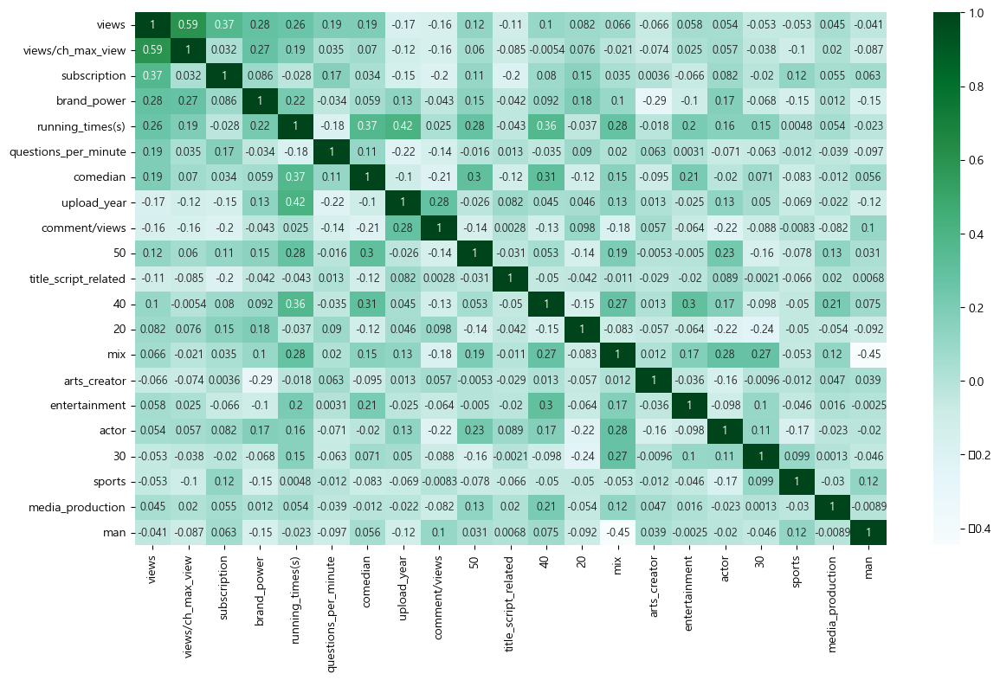

In [82]:
plt.figure(figsize=(14,8))
sns.heatmap(top20_corr, cmap='BuGn', annot=True, annot_kws={"size": 9})
plt.show()

## EDA와 인사이트 추출

### 1. 조회수(label)와 feature간의 관계

#### 조회수 분포 확인
- 10만 ~ 150만 사이의 조회수 성과가 나오는 영상이 전체 영상중 51% 정도의 비중으로 가장 많음.

In [83]:
min(contents_df['views'])

100098

In [84]:
max(contents_df['views'])

24711227

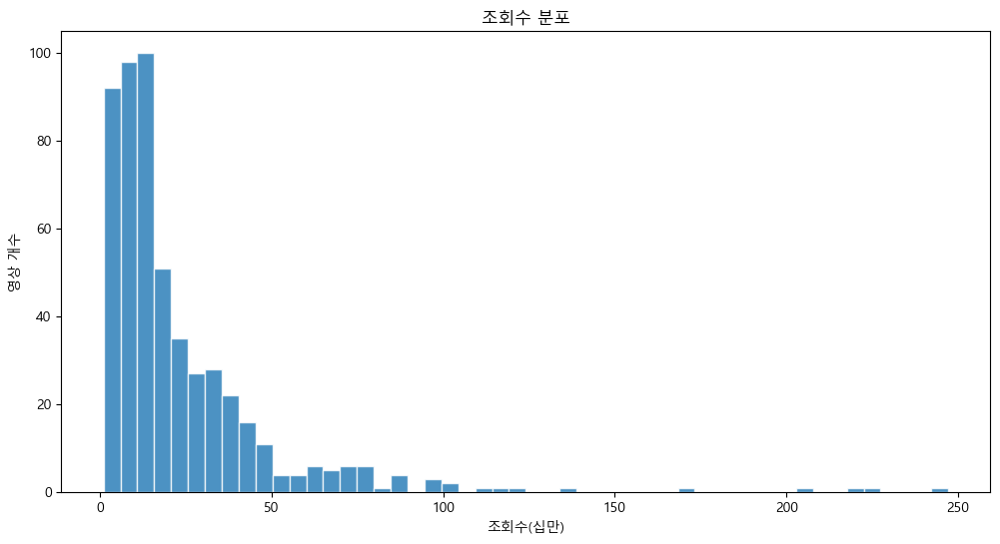

In [85]:
plt.figure(figsize=(12,6))
plt.hist(contents_df_final['views']/100000, bins=50, alpha=0.8, edgecolor='white')
plt.title('조회수 분포')
plt.xlabel('조회수(십만)')
plt.ylabel('영상 개수')
plt.show()

In [86]:
contents_df_final[contents_df_final['views'] <= 1500000]['views'].count() / contents_df_final['views'].count()

0.5075471698113208

- 조회수가 비대칭적이어서 회귀 예측시 큰값에 대해서 예측을 잘 못할 수 있다.
- 로그 변환을 통해 대칭적인 분포로 변경

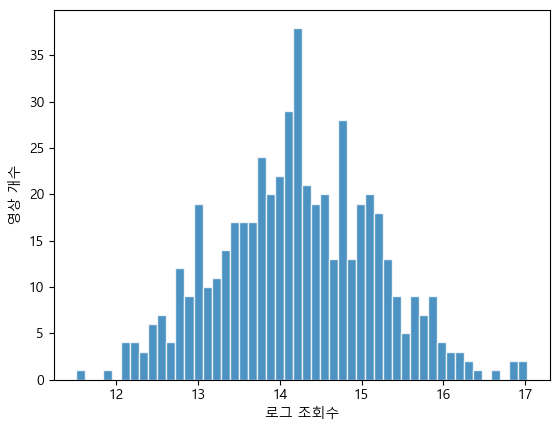

In [87]:
log_views = np.log(contents_df_final['views'])
plt.hist(log_views, bins=50, alpha=0.8, edgecolor='white')
# plt.title('로그 변환 조회수 분포')
plt.xlabel('로그 조회수')
plt.ylabel('영상 개수')
plt.show()

In [88]:
contents_df_final['log_views'] = log_views
contents_df_final.head()

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,questions_per_minute,title_script_related,z_score,views/ch_max_view,likes/views,comment/views,man,woman,mix,log_views
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,3.3,0.036413,-0.783610,0.148806,0.050963,0.003499,0.0,1.0,0.0,12.369318
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,2.7,0.090037,-0.863153,0.128990,0.053893,0.004321,1.0,0.0,0.0,12.226409
2,재친구,311000.0,5200,256904,2024,9,389,1661,1,중,...,2.1,0.131204,-0.729224,0.162354,0.020241,0.001514,0.0,1.0,0.0,12.456458
3,재친구,311000.0,32000,607036,2024,9,1581,1828,1,상,...,2.7,0.174963,0.158982,0.383626,0.052715,0.002604,0.0,1.0,0.0,13.316343
4,재친구,311000.0,14000,285835,2024,9,654,1572,0,중,...,2.1,0.052299,-0.655833,0.180638,0.048979,0.002288,1.0,0.0,0.0,12.563170


- log_views와 관계된 Top20 상관관계 다시 살펴보기

In [89]:
sort_contents_df_corr = contents_df_final.drop(columns=['channel', 'sex', 'likes', 'comment_count', 'views', 'z_score'])

# 상관관계 계산을 위한 brand_power 컬럼 숫자로 변환
sort_contents_df_corr['brand_power'] = sort_contents_df_corr['brand_power'].replace({'상': 2, '중': 1, '하': 0})
sort_contents_df_corr

corr = sort_contents_df_corr.corr()
logviews_corr = corr['log_views'].abs().sort_values(ascending=False)
logviews_top20_columns = logviews_corr.index[:21]
len(logviews_top20_columns), logviews_top20_columns

logviews_top20_corr = corr.loc[logviews_top20_columns, logviews_top20_columns]

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_24220\1195086693.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  sort_contents_df_corr['brand_power'] = sort_contents_df_corr['brand_power'].replace({'상': 2, '중': 1, '하': 0})


In [90]:
logviews_top20_corr['log_views'].round(2)

log_views               1.00
views/ch_max_view       0.69
subscription            0.44
comment/views          -0.36
running_times(s)        0.32
brand_power             0.32
comedian                0.27
upload_year            -0.23
questions_per_minute    0.22
likes/views            -0.21
50                      0.18
actor                   0.13
title_script_related   -0.12
mix                     0.12
40                      0.12
singer                 -0.12
entertainment           0.09
arts_creator           -0.08
business_other         -0.07
20                      0.06
man                    -0.05
Name: log_views, dtype: float64

c:\Users\Paris\miniconda3\envs\ds_study\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.draw()
c:\Users\Paris\miniconda3\envs\ds_study\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 8722 (\N{MINUS SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


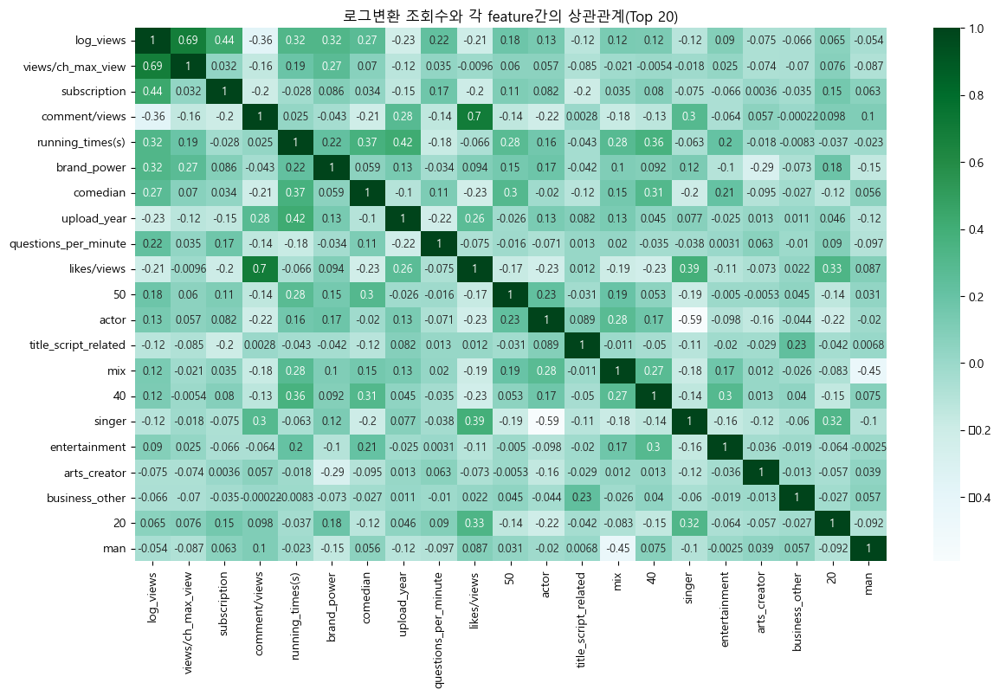

In [91]:
plt.figure(figsize=(14,8))
sns.heatmap(logviews_top20_corr, cmap='BuGn', annot=True, annot_kws={"size": 9})
plt.title('로그변환 조회수와 각 feature간의 상관관계(Top 20)')
plt.show()

### 2. 상관관계를 통해 관련있는 feature와 조회수 시각화
- 경향성만 보자면 log_views와의 관계를 시각화하는 것이 맞지만 관계성이 약한 feature들은 조금 더 디테일한 조회수를 보기위해 views 데이터와의 관계를 시각화함.

#### 현재 구독자수와 채널 평균 조회수 관계
- 구독자수가 높다고 평균 조회수가 높은 것은 아니다.

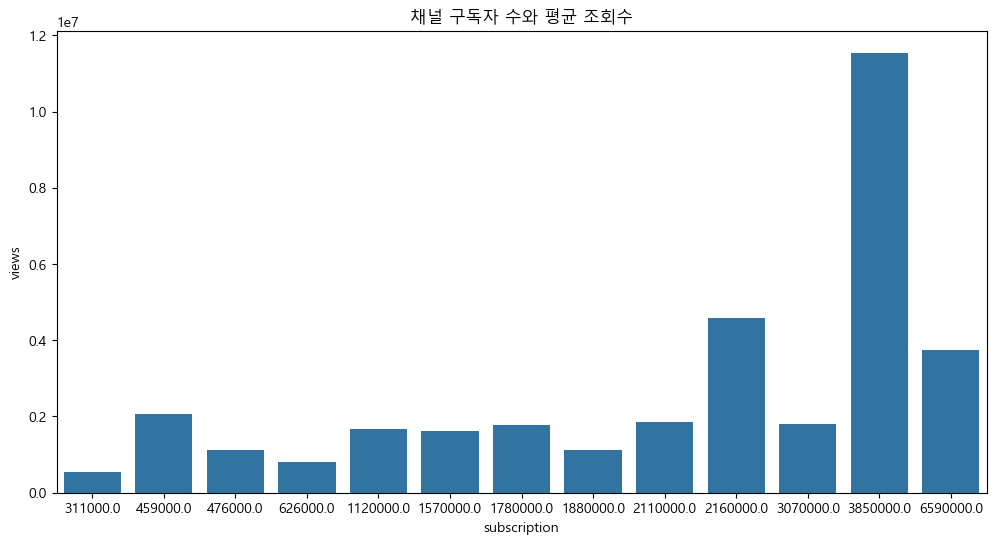

In [92]:
plt.figure(figsize=(12,6))
sns.barplot(contents_df_final, x='subscription', y='views', estimator='mean', errorbar=None)
plt.title('채널 구독자 수와 평균 조회수')
plt.show()

#### 게스트 브랜드 파워와 조회수와의 관계
- 게스트들의 영향력을 나타내는 브랜드 파워 지수가 높을수록 더 높은 조회수를 기록하고 있다.
- 조회수 성과 또한 브랜드 파워 지수가 높은 게스트가 출현했을 때의 성과가 전반적으로 더 좋다.


In [93]:
contents_df_final.columns

Index(['channel', 'subscription', 'likes', 'views', 'upload_year',
       'upload_month', 'comment_count', 'running_times(s)', 'sex',
       'brand_power', 'entertainment', 'actor', 'comedian', 'singer',
       'arts_creator', 'sports', 'media_production', 'business_other', '10',
       '20', '30', '40', '50', '60', 'questions_per_minute',
       'title_script_related', 'z_score', 'views/ch_max_view', 'likes/views',
       'comment/views', 'man', 'woman', 'mix', 'log_views'],
      dtype='object')

In [94]:
mean_values = contents_df_final.groupby('brand_power')['views'].mean().sort_values(ascending=True)
mean_values

brand_power
하    1.496163e+06
중    1.867464e+06
상    3.713232e+06
Name: views, dtype: float64

In [95]:
sorted_order = mean_values.index.tolist()
sorted_order

['하', '중', '상']

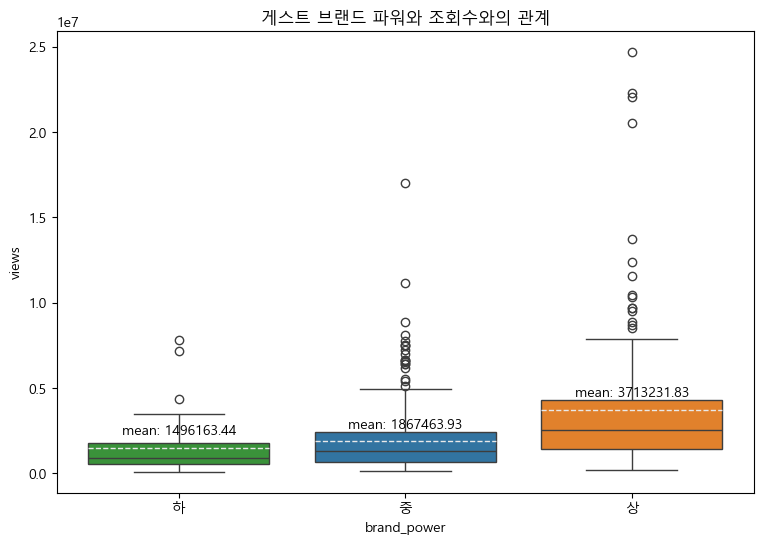

In [96]:
plt.figure(figsize=(9,6))
ax = sns.boxplot(contents_df_final, x='brand_power', y='views', hue='brand_power', order=sorted_order)

for idx, j in enumerate(mean_values.index):
    mean_val = mean_values[j]
    ax.text(idx, mean_val+800000, f'mean: {mean_val:.2f}', horizontalalignment='center', size=10)
    # ax.plot([x축 좌표 범위], [y축 좌표 범위])
    ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#E9E9E9', linestyle='--', linewidth=1)

plt.title('게스트 브랜드 파워와 조회수와의 관계')
plt.show()

In [97]:
mean_values_vc = contents_df_final.groupby('brand_power')['views/ch_max_view'].mean().sort_values(ascending=True)
mean_values_vc

brand_power
하    0.249028
중    0.300103
상    0.435130
Name: views/ch_max_view, dtype: float64

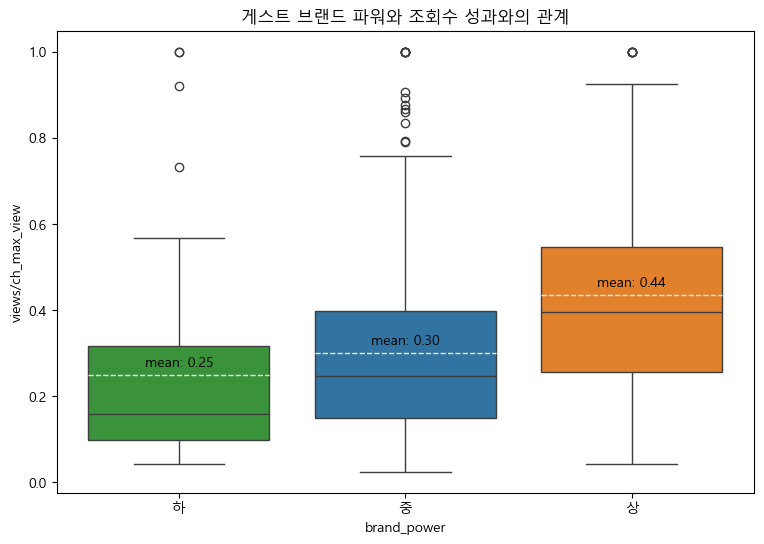

In [98]:
plt.figure(figsize=(9,6))
ax = sns.boxplot(contents_df_final, x='brand_power', y='views/ch_max_view', hue='brand_power', order=sorted_order)

for idx, j in enumerate(mean_values_vc.index):
    mean_val = mean_values_vc[j]
    ax.text(idx, mean_val+0.02, f'mean: {mean_val:.2f}', horizontalalignment='center', size=10)
    # ax.plot([x축 좌표 범위], [y축 좌표 범위])
    ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#E9E9E9', linestyle='--', linewidth=1)

plt.title('게스트 브랜드 파워와 조회수 성과와의 관계')
plt.show()

#### 게스트 브랜드 파워와 다른 지표와의 관여도
- 노출도 증가로 인한 간접적 조회수 증가: 브랜드 파워 → 좋아요 증가 → 추천 알고리즘 강화 → 조회수 증가

In [99]:
contents_df_final.columns

Index(['channel', 'subscription', 'likes', 'views', 'upload_year',
       'upload_month', 'comment_count', 'running_times(s)', 'sex',
       'brand_power', 'entertainment', 'actor', 'comedian', 'singer',
       'arts_creator', 'sports', 'media_production', 'business_other', '10',
       '20', '30', '40', '50', '60', 'questions_per_minute',
       'title_script_related', 'z_score', 'views/ch_max_view', 'likes/views',
       'comment/views', 'man', 'woman', 'mix', 'log_views'],
      dtype='object')

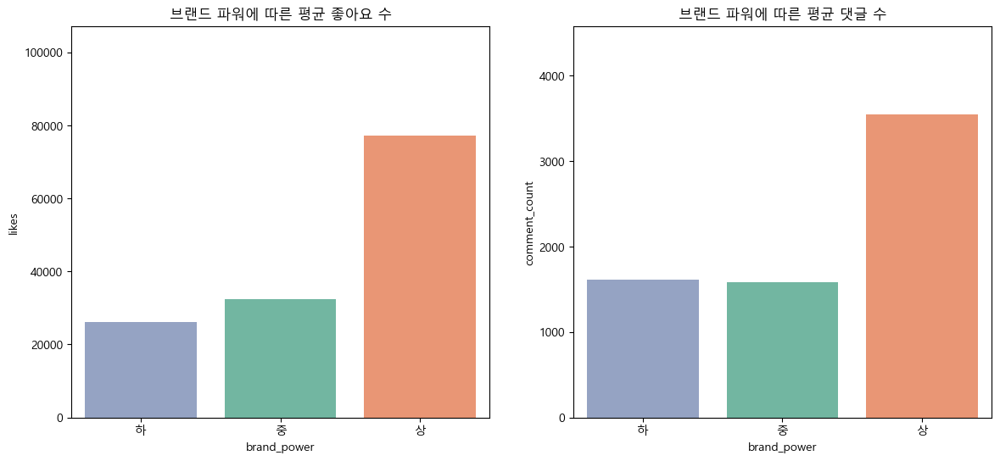

In [134]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.barplot(contents_df_final, x='brand_power', y='likes',
            estimator='mean',
            order= sorted_order,
            hue='brand_power',
            palette='Set2',
            ax=axes[0],
            err_kws={'linewidth': False})
axes[0].set_title('브랜드 파워에 따른 평균 좋아요 수')

sns.barplot(contents_df_final, x='brand_power', y='comment_count',
            estimator='mean',
            order= sorted_order,
            hue='brand_power',
            palette='Set2',
            ax=axes[1],
            err_kws={'linewidth': False})
axes[1].set_title('브랜드 파워에 따른 평균 댓글 수')

plt.show()

#### 게스트 직업간 조회수와의 관계
- 연예인 직업군에서 평균 조회수가 높게 나오며 코메디언이 출현했을 때 평균 조회수가 가장 높다.
- 방송/제작자(media_production) 직군은 모집단의 수가 너무 적기에 평균 조회수가 높더라도 지금의 데이터로 판단할 수 없다.
- 하지만 영상의 조회수 성과 지표로 본다면 연예인 직업군간의 성과 정도는 차이가 없다.
- 배우, 가수가 나오는 경우 평균 조회수에 비해 월등히 조회수가 많이 나오는 영상들이 일부 포진하고 있어 해당 직군은 게스트의 영향력이 더 클것으로 보인다.

[최종 인사이트]
- 코메디언이 게스트로 나오는 경우 평균 조회수가 가장 높게 측정됨.
- 가수의 경우 일부 게스트에서 굉장히 높은 조회수와 조회수 성과까지 보이는 게스트들(대세 아이돌)이 존재해 가수 직군이 다른 직군에 비해 비교적 게스트에 영향을 받는 것으로 확인됨.

In [190]:
contents_df_final.columns
job_list = ['entertainment', 'actor', 'comedian',
       'singer', 'arts_creator', 'sports', 'media_production',
       'business_other']

In [191]:
# 직업 컬럼을 long-form 형태로 변환
contents_melted = contents_df_final.melt(id_vars=['views'], value_vars=job_list,
                                         var_name='job', value_name='has_job')
contents_melted

,views,job,has_job
0,235465,entertainment,0
1,204109,entertainment,0
2,256904,entertainment,0
3,607036,entertainment,0
4,285835,entertainment,0
...,...,...,...
4235,730772,business_other,0
4236,294526,business_other,1
4237,793769,business_other,0
4238,518195,business_other,0


In [192]:
# 직업이 있는 경우만 필터링
contents_melted = contents_melted[contents_melted['has_job'] == 1]
mean_values = contents_melted.groupby('job')['views'].mean().sort_values(ascending=False)
mean_values

job
comedian            3.578864e+06
media_production    3.382152e+06
entertainment       2.876054e+06
actor               2.567081e+06
singer              2.335685e+06
sports              1.736810e+06
arts_creator        1.501076e+06
business_other      6.423900e+05
Name: views, dtype: float64

In [193]:
job_counts = contents_melted.groupby('job')['has_job'].sum()
job_counts

job
actor               180
arts_creator         24
business_other        2
comedian             85
entertainment        47
media_production      8
singer              260
sports               29
Name: has_job, dtype: int64

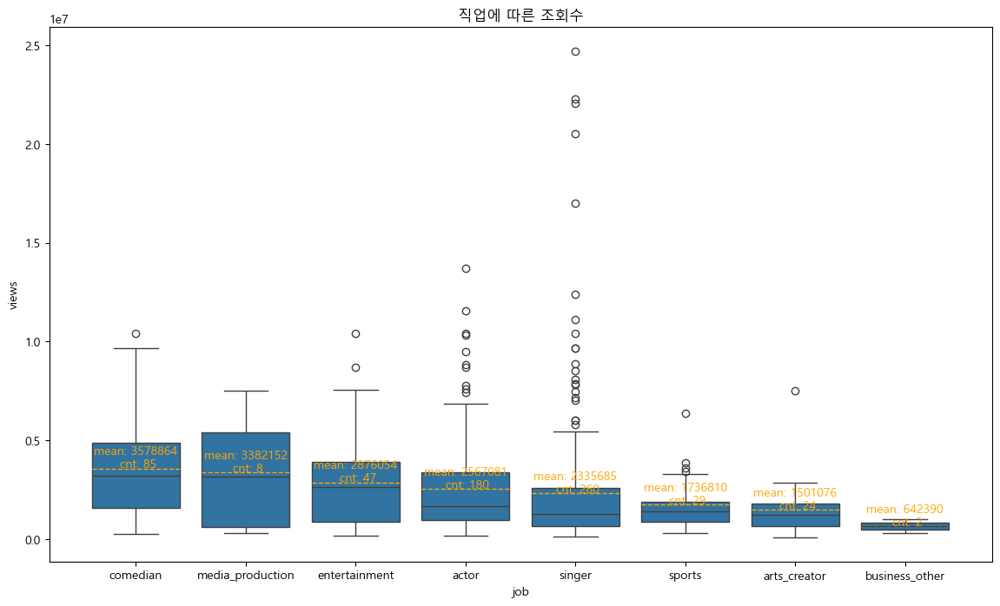

In [194]:
plt.figure(figsize=(14, 8))
ax = sns.boxplot(x='job', y='views', data=contents_melted, order=mean_values.index)

# 직업별 평균값 표기
for idx, j in enumerate(mean_values.index):
    mean_val = mean_values[j]
    job_cnt = job_counts[j]
    ax.text(idx, mean_val+30000, f'mean: {mean_val:.0f}\n cnt: {job_cnt}', horizontalalignment='center', size=10, color='#FFA500')
    # ax.plot([x축 좌표 범위], [y축 좌표 범위])
    ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#FFA500', linestyle='--', linewidth=1)
plt.title('직업에 따른 조회수')
plt.show()

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22924\3779966123.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='job', y='views', data=contents_melted, order=mean_values.index, palette='Set2', errwidth=False)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22924\3779966123.py:2: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': False}` instead.

  ax = sns.barplot(x='job', y='views', data=contents_melted, order=mean_values.index, palette='Set2', errwidth=False)


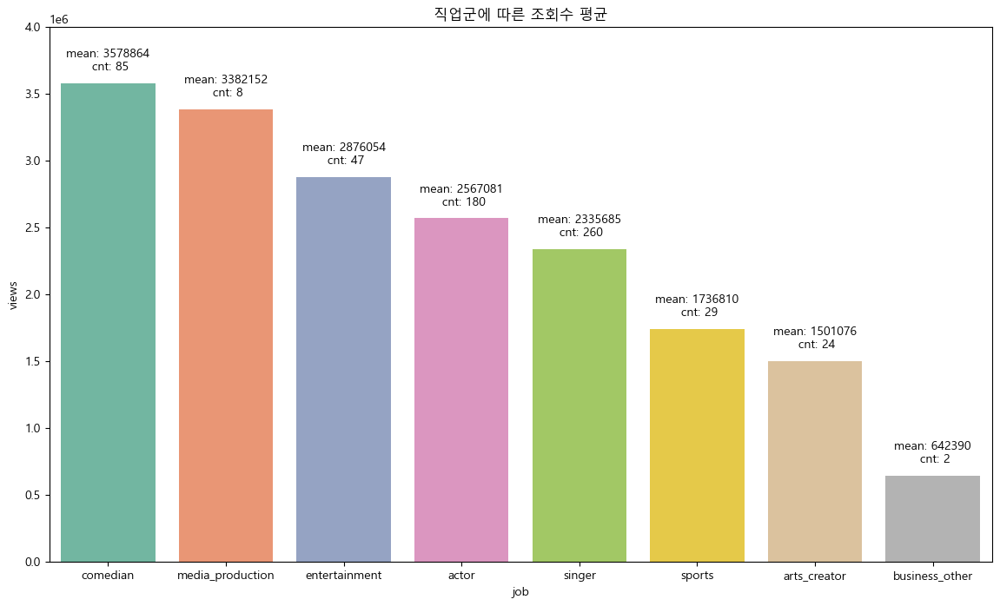

In [195]:
plt.figure(figsize=(14, 8))
ax = sns.barplot(x='job', y='views', data=contents_melted, order=mean_values.index, palette='Set2', errwidth=False)

# 직업별 평균값 표기
for idx, j in enumerate(mean_values.index):
    mean_val = mean_values[j]
    job_cnt = job_counts[j]
    ax.text(idx, mean_val+100000, f'mean: {mean_val:.0f}\n cnt: {job_cnt}', horizontalalignment='center', size=10, color='#000000')
    # ax.plot([x축 좌표 범위], [y축 좌표 범위])
    # ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#FFA500', linestyle='--', linewidth=1)
plt.title('직업군에 따른 조회수 평균')
plt.ylim(0, 4000000)
plt.show()

In [196]:
# 직업 컬럼을 long-form 형태로 변환
contents_melted_vc = contents_df_final.melt(id_vars=['views/ch_max_view'], value_vars=job_list,
                                            var_name='job', value_name='has_job')
contents_melted_vc

,views/ch_max_view,job,has_job
0,0.148806,entertainment,0
1,0.128990,entertainment,0
2,0.162354,entertainment,0
3,0.383626,entertainment,0
4,0.180638,entertainment,0
...,...,...,...
4235,0.082644,business_other,0
4236,0.033309,business_other,1
4237,0.089769,business_other,0
4238,0.058604,business_other,0


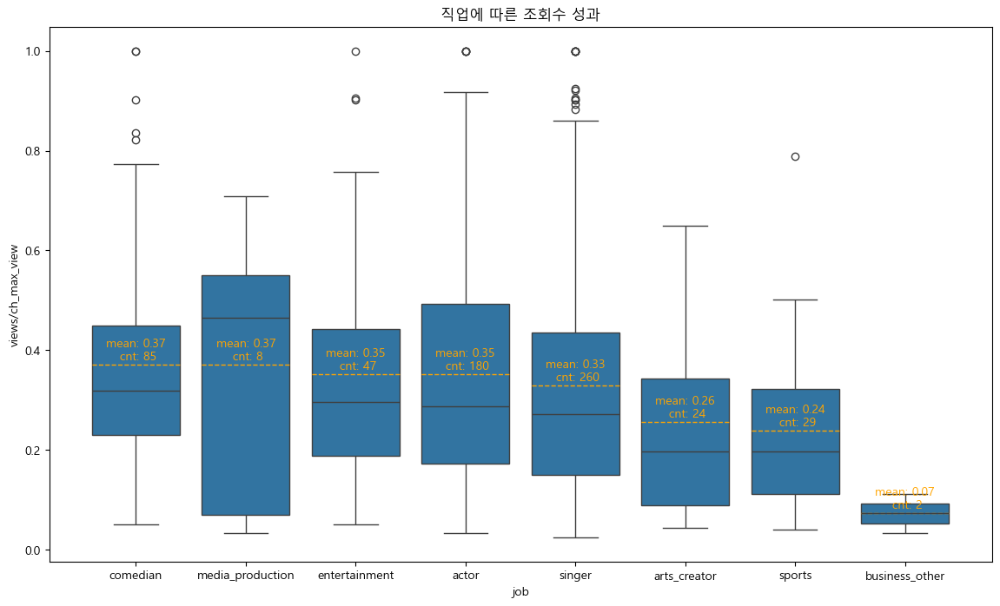

In [197]:
# 직업이 있는 경우만 필터링
contents_melted_vc = contents_melted_vc[contents_melted_vc['has_job'] == 1]
mean_values_vc = contents_melted_vc.groupby('job')['views/ch_max_view'].mean().sort_values(ascending=False)
job_counts = contents_melted_vc.groupby('job')['has_job'].sum()

plt.figure(figsize=(14, 8))
ax = sns.boxplot(x='job', y='views/ch_max_view', data=contents_melted_vc, order=mean_values_vc.index)

# 직업별 평균값 표기
for idx, j in enumerate(mean_values_vc.index):
    mean_val = mean_values_vc[j]
    job_cnt = job_counts[j]
    ax.text(idx, mean_val+0.01, f'mean: {mean_val:.2f}\n cnt: {job_cnt}', horizontalalignment='center', size=10, color='#FFA500')
    # ax.plot([x축 좌표 범위], [y축 좌표 범위])
    ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#FFA500', linestyle='--', linewidth=1)
plt.title('직업에 따른 조회수 성과')
plt.show()

- 조회수 성과까지 굉장히 높은 가수들은 누구일까?

In [198]:
top_singer = contents_df_final[(contents_df_final['singer'] == 1) & (contents_df_final['views/ch_max_view'] != 1)].sort_values('views/ch_max_view', ascending=False)
for i in list(top_singer['title_script_related'][:10]):
    match_row = contents_df[contents_df['title_script_related'] == i]
    g = list(match_row['guest'])
    v = list(match_row['views'])
    print(g, v)


['수지'] [2671462]
['소야, 소미'] [7150798]
['르세라핌'] [7031801]
['지수'] [22301606]
['지석진, 오나라, 홍진경, 송지효, 이동욱, 남창희, 조세호, 양세형, 이동휘, 키, 이미주, 권진아'] [10430431]
['조슈아,도겸'] [22066062]
['윈터'] [2550957]
['스트레이키즈'] [1361202]
['에스쿱스'] [3925903]
['슈가,지민, 조세호, 지석진'] [9673657]


#### 게스트 나이와 조회수와의 관계
- 게스트가 50대인 경우 평균 조회수가 가장 높지만 20, 30, 40대에 비해 상대적으로 모수가 1/3 정도 수준이어서 50대의 p-value 확인.
- 50대와 20대의 조회수 차이에 대한 p-value를 확인해본 결과 0.53%로 5%에 비해 매우 낮은 값이므로 50대의 데이터수가 상대적으로 적더라도 신뢰성있는 결과라고 할 수 있다.
- 60대, 10대에서 비교적 평균 조회수 성과가 높게 나왔지만 워낙 출현자수가 적어 해당 나이대가 조회수 성과가 높다고 할 수 없다.

[최종 인사이트]
- 50대 게스트의 경우 상대적으로 조회수가 높게 나오며 20, 30, 40 대 게스트는 비교적 조회수 차이가 적음.

In [199]:
contents_df_final.columns
age_list = ['10', '20', '30', '40', '50', '60']

In [200]:
age_melted = contents_df_final.melt(id_vars=['views'], value_vars=age_list,
                                         var_name='age', value_name='guest_count')
age_melted['age'] = age_melted['age'].astype(int)
age_melted = age_melted[age_melted['guest_count'] > 0]
age_melted

,views,age,guest_count
16,808959,10,1
29,1032579,10,1
89,4404104,10,3
99,2712686,10,3
162,7031801,10,1
...,...,...,...
2686,2026733,60,1
2696,2768729,60,1
2907,2341111,60,1
3060,153492,60,1


In [201]:
# age_melted[age_melted['age'] == 60]
age_counts = age_melted.groupby('age')['guest_count'].sum()
age_counts[10]

16

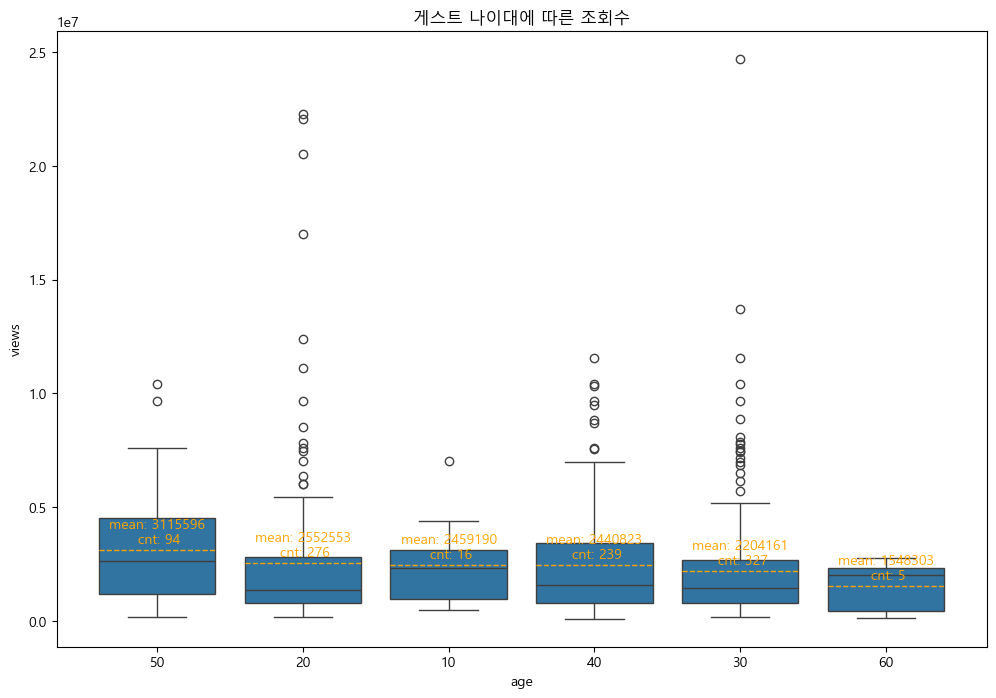

In [202]:
plt.figure(figsize=(12,8))
mean_values = age_melted.groupby('age')['views'].mean().sort_values(ascending=False)
age_counts = age_melted.groupby('age')['guest_count'].sum()
ax = sns.boxplot(x='age', y='views', data=age_melted, order=mean_values.index)

for idx, a in enumerate(mean_values.index):
    mean_val = mean_values[a]
    age_cnt = age_counts[a]
    ax.text(idx, mean_val+300000, f'mean: {mean_val:.0f}\n cnt: {age_cnt}', horizontalalignment='center', size=10, color='#FFA500')
    ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#FFA500', linestyle='--', linewidth=1)
plt.title('게스트 나이대에 따른 조회수')
plt.show()

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22924\1000147536.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='age', y='views', data=age_melted, order=mean_values.index, palette='Set2', errwidth=False)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_22924\1000147536.py:4: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': False}` instead.

  ax = sns.barplot(x='age', y='views', data=age_melted, order=mean_values.index, palette='Set2', errwidth=False)


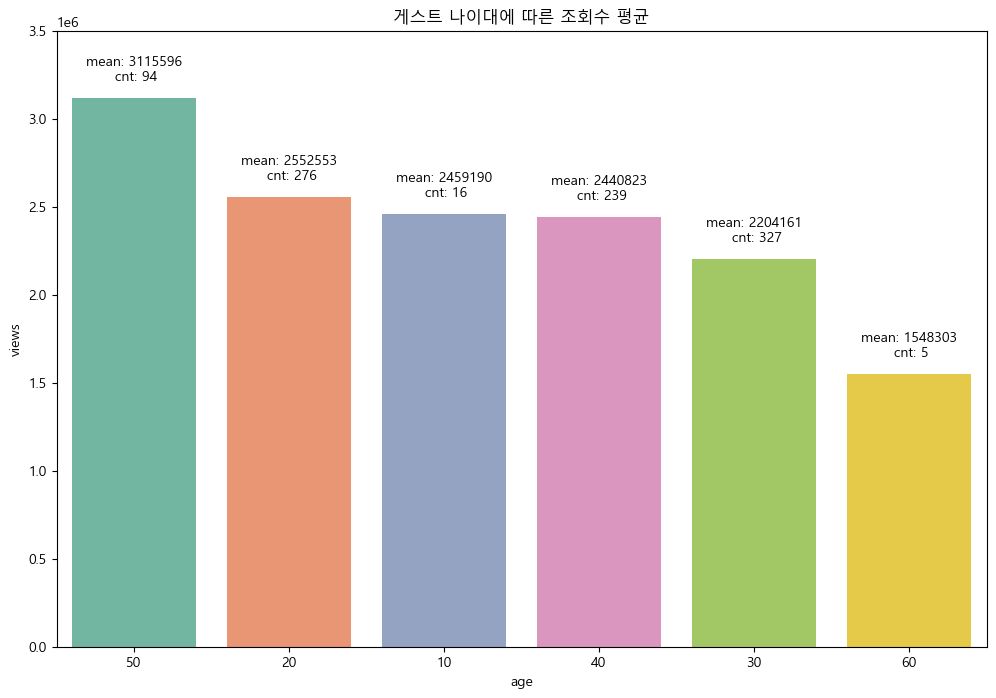

In [203]:
plt.figure(figsize=(12,8))
mean_values = age_melted.groupby('age')['views'].mean().sort_values(ascending=False)
age_counts = age_melted.groupby('age')['guest_count'].sum()
ax = sns.barplot(x='age', y='views', data=age_melted, order=mean_values.index, palette='Set2', errwidth=False)

for idx, a in enumerate(mean_values.index):
    mean_val = mean_values[a]
    age_cnt = age_counts[a]
    ax.text(idx, mean_val+100000, f'mean: {mean_val:.0f}\n cnt: {age_cnt}', horizontalalignment='center', size=10, color='#000000')
    # ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#FFA500', linestyle='--', linewidth=1)
plt.title('게스트 나이대에 따른 조회수 평균')
plt.ylim(0, 3500000)
plt.show()

- 50대의 결과가 신뢰성이 있는지 확인(일반 views는 정규분포를 따르지 않아 log_views로 확인)
- p-value로 확인해본 결과 50대와 20대의 조회수 차이가 우연히 발생할 확률이 0.53% 정도밖에 안됨.
- p-value 값이 0.05(5%) 보다 작으므로 50대와 20대의 조회수 차이는 우연이 아니라 실제로 다를 가능성이 매우 높다는 것을 의미하며 50대의 평균 조회수는 신뢰할 수 있다.

In [204]:
age_melted_log = contents_df_final.melt(id_vars=['log_views'], value_vars=age_list,
                                         var_name='age', value_name='guest_count')
age_melted_log['age'] = age_melted['age'].astype(int)
age_melted_log = age_melted_log[age_melted_log['guest_count'] > 0]
age_melted_log

,log_views,age,guest_count
16,13.603504,10.0,1
29,13.847570,10.0,1
89,15.298047,10.0,3
99,14.813450,10.0,3
162,15.765953,10.0,1
...,...,...,...
2686,14.521936,60.0,1
2696,14.833899,60.0,1
2907,14.666136,60.0,1
3060,11.941404,60.0,1


In [205]:
# 분산 확인
age_melted_log.groupby('age')['log_views'].var()

age
10.0    0.668462
20.0    0.956721
30.0    0.845051
40.0    0.974566
50.0    0.888627
60.0    1.600678
Name: log_views, dtype: float64

In [206]:
# 표준편차 확인
age_melted_log.groupby('age')['log_views'].std()

age
10.0    0.817595
20.0    0.978121
30.0    0.919267
40.0    0.987201
50.0    0.942670
60.0    1.265179
Name: log_views, dtype: float64

In [207]:
age_20 = age_melted_log[age_melted_log['age'] == 20]['log_views'].to_list()
age_50 = age_melted_log[age_melted_log['age'] == 50]['log_views'].to_list()

In [208]:
import scipy.stats as stats

# 50대와 20대의 조회수 차이에 대한 p-value
t_stat, p_value = stats.ttest_ind(age_50, age_20) # age_50, age_20 앞/뒤 위치는 상관 없음. 두 그룹을 비교하는 것임.
print('t_stat: ', t_stat)
print('p_value: ', p_value)

t_stat:  2.8145374697011265
p_value:  0.005284941939443381


In [209]:
age_melted_vc = contents_df_final.melt(id_vars=['views/ch_max_view'], value_vars=age_list,
                                       var_name='age', value_name='guest_count')
age_melted_vc['age'] = age_melted_vc['age'].astype(int)
age_melted_vc = age_melted_vc[age_melted_vc['guest_count'] > 0]
age_melted_vc

,views/ch_max_view,age,guest_count
16,0.511234,10,1
29,0.372943,10,1
89,0.455542,10,3
99,0.280589,10,3
162,0.905098,10,1
...,...,...,...
2686,0.732008,60,1
2696,1.000000,60,1
2907,0.587153,60,1
3060,0.053087,60,1


In [210]:
# age_melted[age_melted['age'] == 60]
age_counts = age_melted_vc.groupby('age')['guest_count'].sum()
age_counts[10]

16

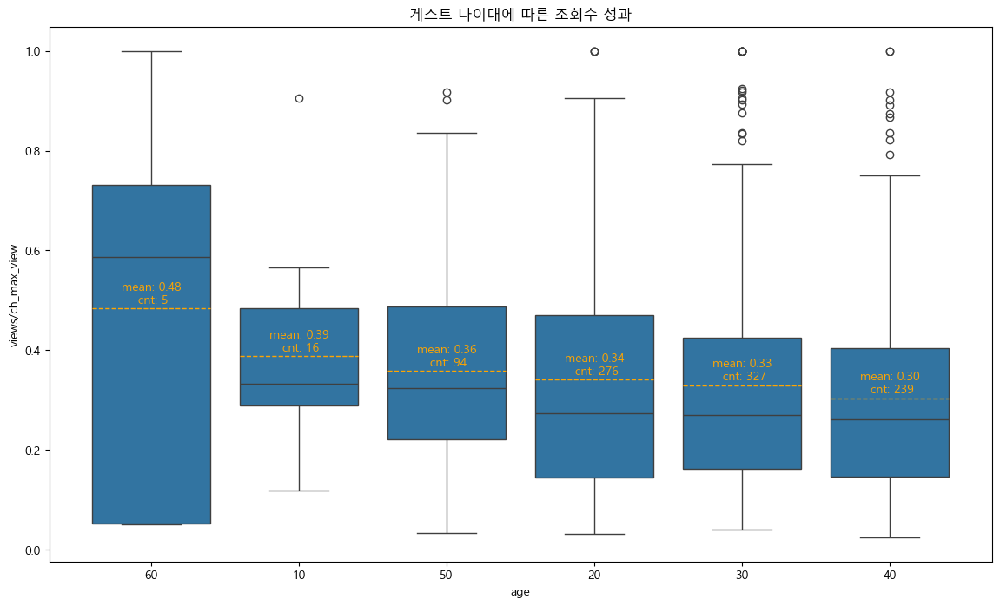

In [211]:
plt.figure(figsize=(14,8))
mean_values_vc = age_melted_vc.groupby('age')['views/ch_max_view'].mean().sort_values(ascending=False)
age_counts = age_melted_vc.groupby('age')['guest_count'].sum()
ax = sns.boxplot(x='age', y='views/ch_max_view', data=age_melted_vc, order=mean_values_vc.index)

for idx, a in enumerate(mean_values_vc.index):
    mean_val = mean_values_vc[a]
    age_cnt = age_counts[a]
    ax.text(idx, mean_val+0.01, f'mean: {mean_val:.2f}\n cnt: {age_cnt}', horizontalalignment='center', size=10, color='#FFA500')
    ax.plot([idx - 0.4, idx + 0.4], [mean_val, mean_val], color='#FFA500', linestyle='--', linewidth=1)
plt.title('게스트 나이대에 따른 조회수 성과')
plt.show()

#### 댓글수, 좋아요와 조회수간의 관계
- 좋아요와 댓글수는 조회수와 약한 비례관계를 보인다. -> 조회수가 높을수록 더 많은 좋아요와 댓글을 받을 가능성이 높으며 이는 해당 영상을 다시 노출시키는 상호작용을 보인다는 것을 알 수 있음.
- 댓글은 조회수 대비 0.1%, 좋아요는 조회수 대비 1.9% 내외에 분포하는 것으로 보아 영상의 조회수 성과와 상관 없이 시청자들의 참여율이 일정수준을 보이고 있다.

[최종 인사이트]
- 댓글은 조회수 대비 0.1%, 좋아요는 조회수 대비 1.9% 내외에 분포하는 것으로 확인됨.
- 좋아요와 댓글수는 조회수와의 약한 비례관계로 조회수를 높이는 하나의 요소로 작용할 수 있지만 결정적인 요소라고 보기는 어렵다.
- 채널에 올라온 콘텐츠의 성과와 상관 없이 시청자들의 참여율이 일정 수준으로 유지하는 것으로 보아 고유한 시청자 층을 가지고있을 것으로 판단됨.

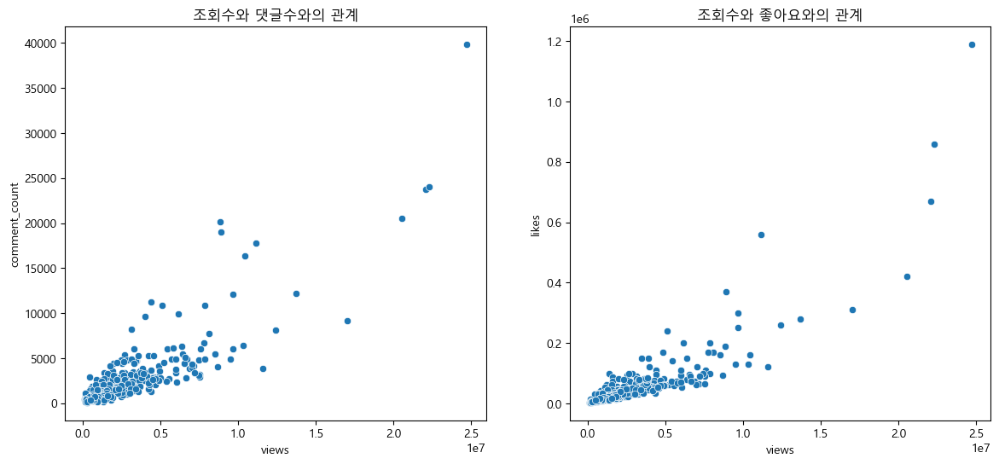

In [212]:
# views 컬럼과의 관계
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(contents_df_final, y='comment_count', x='views', ax = axes[0])
axes[0].set_title('조회수와 댓글수와의 관계')

sns.scatterplot(contents_df_final, y='likes', x='views', ax = axes[1])
axes[1].set_title('조회수와 좋아요와의 관계')

plt.show()

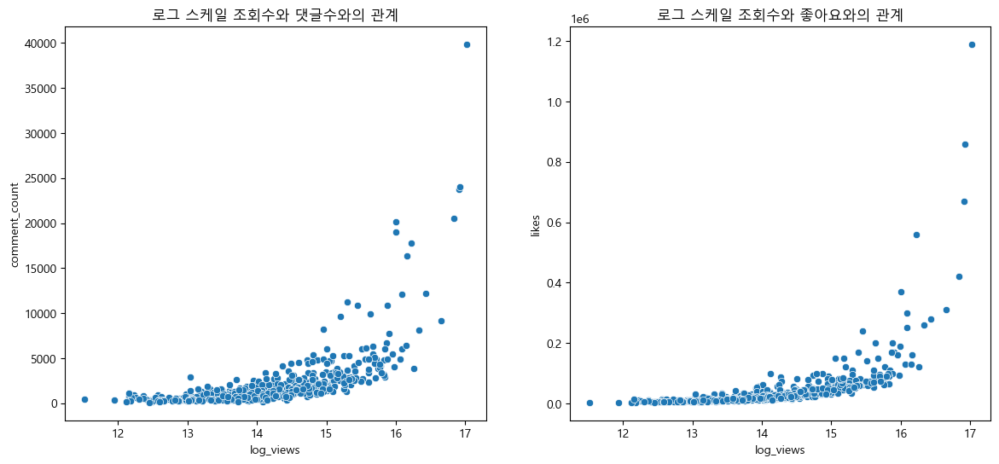

In [213]:
# log_views 컬럼과의 관계
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(contents_df_final, y='comment_count', x='log_views', ax = axes[0])
axes[0].set_title('로그 스케일 조회수와 댓글수와의 관계')

sns.scatterplot(contents_df_final, y='likes', x='log_views', ax = axes[1])
axes[1].set_title('로그 스케일 조회수와 좋아요와의 관계')

plt.show()

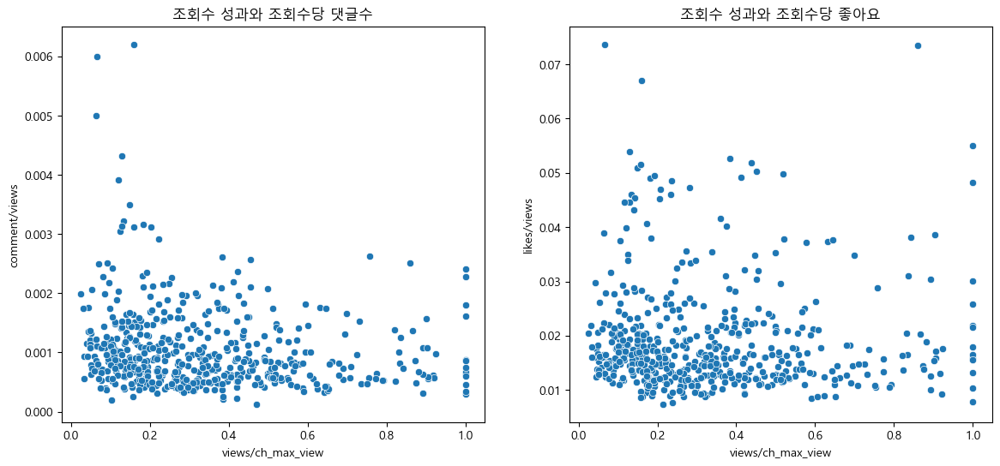

In [214]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(contents_df_final, y='comment/views', x='views/ch_max_view', ax = axes[0])
axes[0].set_title('조회수 성과와 조회수당 댓글수')

sns.scatterplot(contents_df_final, y='likes/views', x='views/ch_max_view', ax = axes[1])
axes[1].set_title('조회수 성과와 조회수당 좋아요')

plt.show()

In [215]:
contents_df_final['comment/views'].mean(), contents_df_final['likes/views'].mean()

(0.001040184938104067, 0.019041843632540495)

#### 제목-스크립트 유사도와 조회수와의 관계
- 약한 음의 상관관계를 보이고 있다.
- 게스트 채널의 특성상 하나의 주제만으로 영상의 내용을 채우기 어려워 기본적으로 제목과 스크립트의 유사도가 높지 않다.
- 시청자들은 제목의 내용에 크게 영향을 받지 않는것으로 판단됨.  

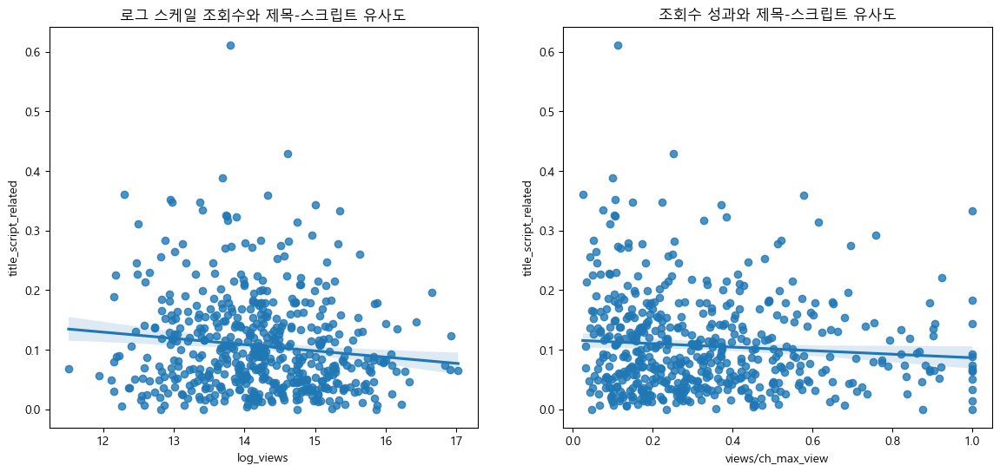

In [216]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.regplot(contents_df_final, x='log_views', y='title_script_related', ax = axes[0])
axes[0].set_title('로그 스케일 조회수와 제목-스크립트 유사도')

sns.regplot(contents_df_final, x='views/ch_max_view', y='title_script_related', ax=axes[1])
axes[1].set_title('조회수 성과와 제목-스크립트 유사도')
plt.show()

#### 질문과 조회수와의 상관관계
- 분당 질문의 개수가 증가할수록 조회수가 증가하는 추세를 보인다.
- 하지만 조회수 성과 자체에는 거의 영향이 없는 것으로 나타났다. -> 하나의 채널에서 비교하는 것이 아니라 구독자수가 다른 다양한 채널을 비교하다보니 절대적으로 조회수가 낮은 영상이 해당 채널에서는 높은 성과를 기록할 수 있다. 즉, 조금더 명확한 관계를 보기 위해서는 채널별로 나눠 비교해보는 것이 좋다고 판단된다.

[최종 인사이트]
- 게스트 출현 채널을 고려해 질문을 통해 게스트와의 상호작용이 높을수록 높은 조회수를 기록하는 것으로 보인단.
- 하지만 일부 채널의 경우 질문의 개수가 적을수록 조회수 성과가 좋게 나오는 경향이 있어 채널의 특성에 따라 질문의 개수의 영향력이 달라진다고 볼 수 있다.
- 즉, 채널의 특성이 중요하다.

In [217]:
contents_df_final.head(2)

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,questions_per_minute,title_script_related,z_score,views/ch_max_view,likes/views,comment/views,man,woman,mix,log_views
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,3.3,0.036413,-0.783610,0.148806,0.050963,0.003499,0.0,1.0,0.0,12.369318
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,2.7,0.090037,-0.863153,0.128990,0.053893,0.004321,1.0,0.0,0.0,12.226409


In [218]:
max(contents_df_final['questions_per_minute'])

7.9

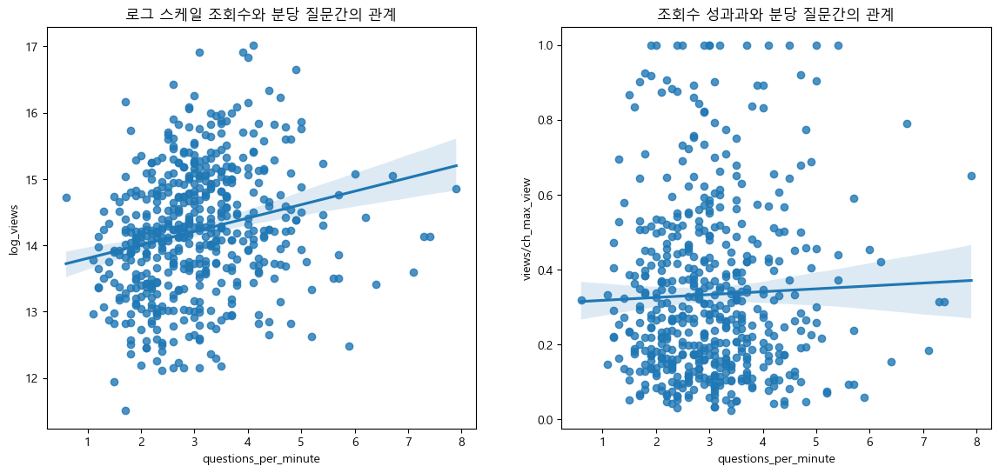

In [219]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.regplot(contents_df_final, x='questions_per_minute', y='log_views', ax = axes[0])
axes[0].set_title('로그 스케일 조회수와 분당 질문간의 관계')

sns.regplot(contents_df_final, x='questions_per_minute', y='views/ch_max_view', ax=axes[1])
axes[1].set_title('조회수 성과과와 분당 질문간의 관계')
plt.show()

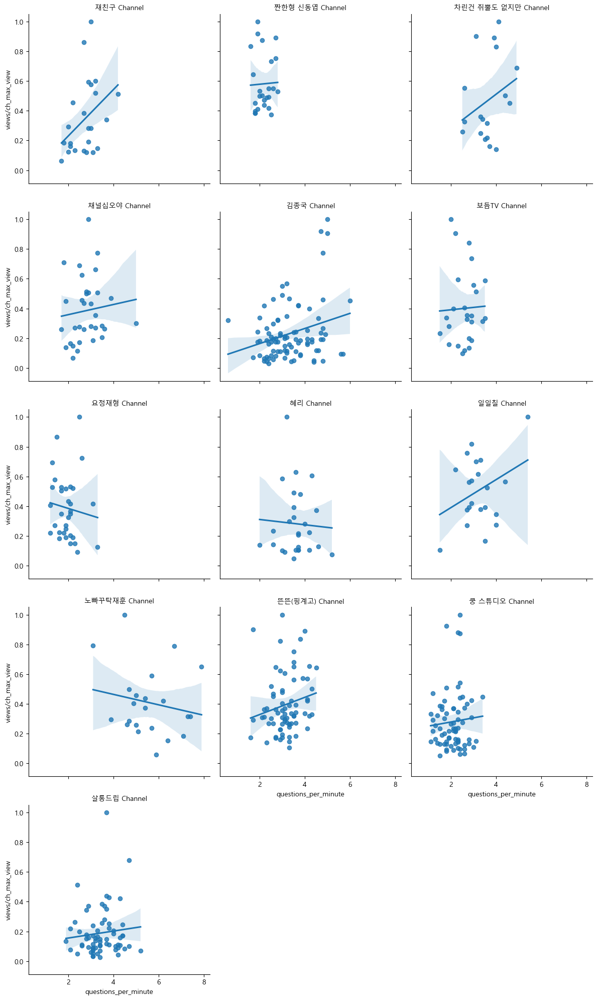

In [220]:
g = sns.FacetGrid(contents_df_final, col='channel', col_wrap=3, height=4)

g.map(sns.regplot, 'questions_per_minute', 'views/ch_max_view')
g.set_titles("{col_name} Channel")
plt.show()

#### 조회수와 영상 길이간의 관계

<Figure size 1400x800 with 0 Axes>

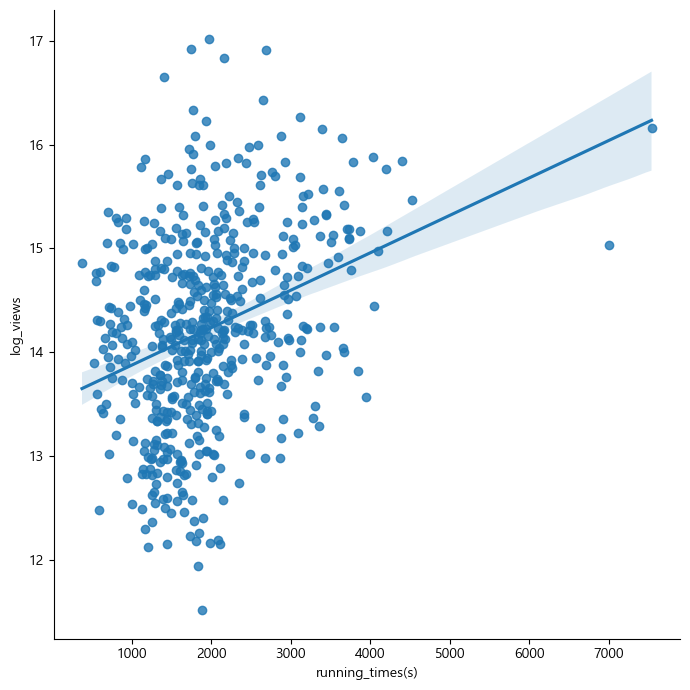

In [46]:
plt.figure(figsize=(14,8))
# sns.scatterplot(sort_contents_df, x='running_times(s)', y='views/ch_max_view')
sns.lmplot(contents_df_final, x='running_times(s)', y='log_views', height=7)
plt.show()

<Figure size 1400x800 with 0 Axes>

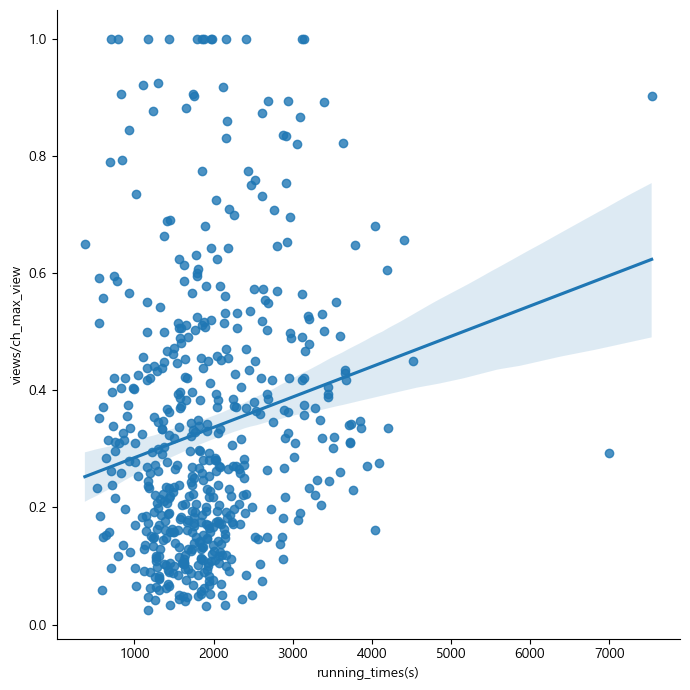

In [221]:
plt.figure(figsize=(14,8))
# sns.scatterplot(sort_contents_df, x='running_times(s)', y='views/ch_max_view')
sns.lmplot(contents_df_final, x='running_times(s)', y='views/ch_max_view', height=7)
plt.show()

#### 출연자 성별과 조회수간의 관계
- 게스트가 여성인 경우의 평균 조회수가 가장 높은 것으로 나타났다.

In [222]:
contents_df_final

,channel,subscription,likes,views,upload_year,upload_month,comment_count,running_times(s),sex,brand_power,...,questions_per_minute,title_script_related,z_score,views/ch_max_view,likes/views,comment/views,man,woman,mix,log_views
0,재친구,311000.0,12000,235465,2024,9,824,1779,1,중,...,3.3,0.036413,-0.783610,0.148806,0.050963,0.003499,0.0,1.0,0.0,12.369318
1,재친구,311000.0,11000,204109,2024,9,882,1729,0,중,...,2.7,0.090037,-0.863153,0.128990,0.053893,0.004321,1.0,0.0,0.0,12.226409
2,재친구,311000.0,5200,256904,2024,9,389,1661,1,중,...,2.1,0.131204,-0.729224,0.162354,0.020241,0.001514,0.0,1.0,0.0,12.456458
3,재친구,311000.0,32000,607036,2024,9,1581,1828,1,상,...,2.7,0.174963,0.158982,0.383626,0.052715,0.002604,0.0,1.0,0.0,13.316343
4,재친구,311000.0,14000,285835,2024,9,654,1572,0,중,...,2.1,0.052299,-0.655833,0.180638,0.048979,0.002288,1.0,0.0,0.0,12.563170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
525,살롱드립,1120000.0,15000,730772,2023,6,844,1310,2,하,...,4.5,0.053971,-0.520656,0.082644,0.020526,0.001155,0.0,0.0,1.0,13.501857
526,살롱드립,1120000.0,4700,294526,2023,6,166,1443,0,중,...,3.1,0.214325,-0.697621,0.033309,0.015958,0.000564,1.0,0.0,0.0,12.593123
527,살롱드립,1120000.0,17000,793769,2023,6,761,1195,1,상,...,4.2,0.228266,-0.495101,0.089769,0.021417,0.000959,0.0,1.0,0.0,13.584548
528,살롱드립,1120000.0,11000,518195,2023,5,359,1305,1,중,...,3.0,0.190194,-0.606889,0.058604,0.021228,0.000693,0.0,1.0,0.0,13.158107


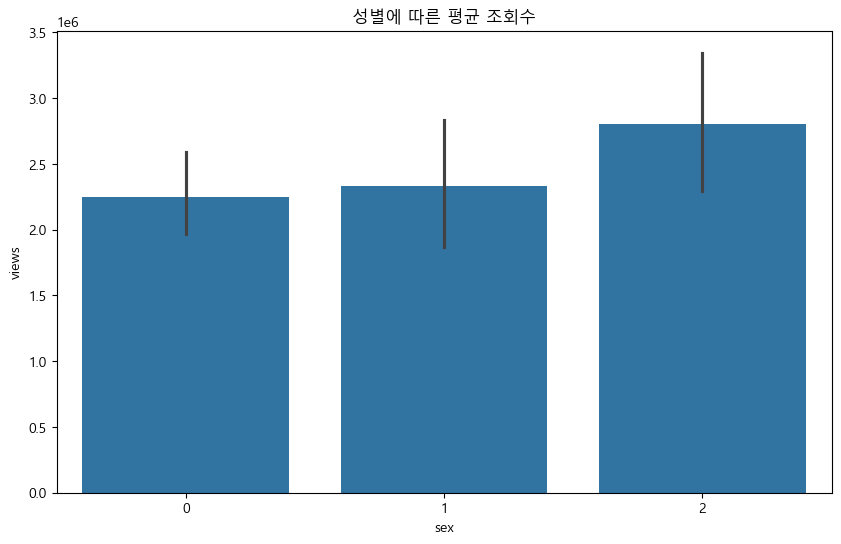

In [223]:
plt.figure(figsize=(10,6))
sns.barplot(x='sex', y='views', data=contents_df_final, estimator='mean')
plt.title('성별에 따른 평균 조회수')
plt.show()

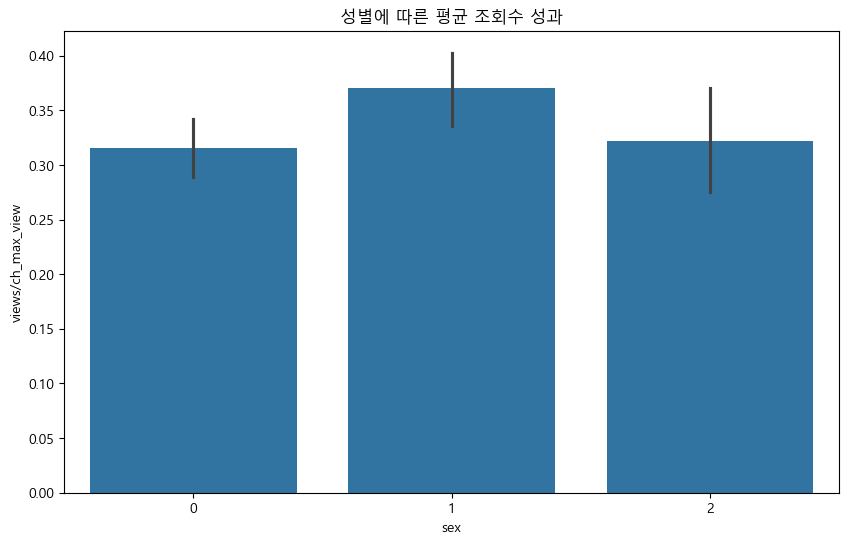

In [224]:
plt.figure(figsize=(10,6))
sns.barplot(x='sex', y='views/ch_max_view', data=contents_df_final, estimator='mean')
plt.title('성별에 따른 평균 조회수 성과')
plt.show()

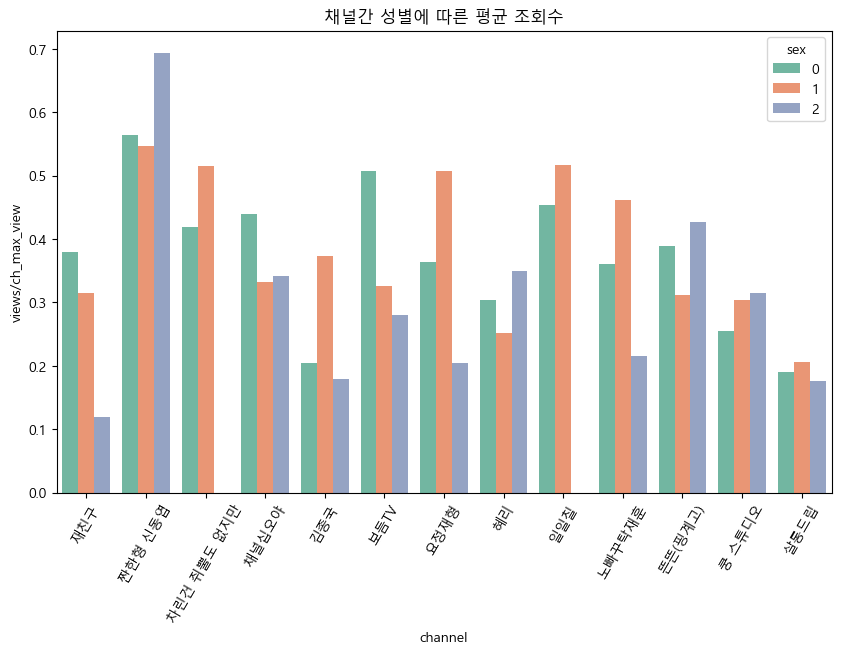

In [225]:
plt.figure(figsize=(10,6))
sns.barplot(x='channel', y='views/ch_max_view', data=contents_df_final, hue='sex', palette='Set2', errorbar=None)
plt.title('채널간 성별에 따른 평균 조회수')
plt.xticks(rotation=60)
plt.show()

### feature간 특성 확인

#### 날짜와 영상의 길이는 어떤 관계가 있을까?
- 시간이 지남에 따라 메인 콘텐츠의 평균 영상 길이가 증가함.

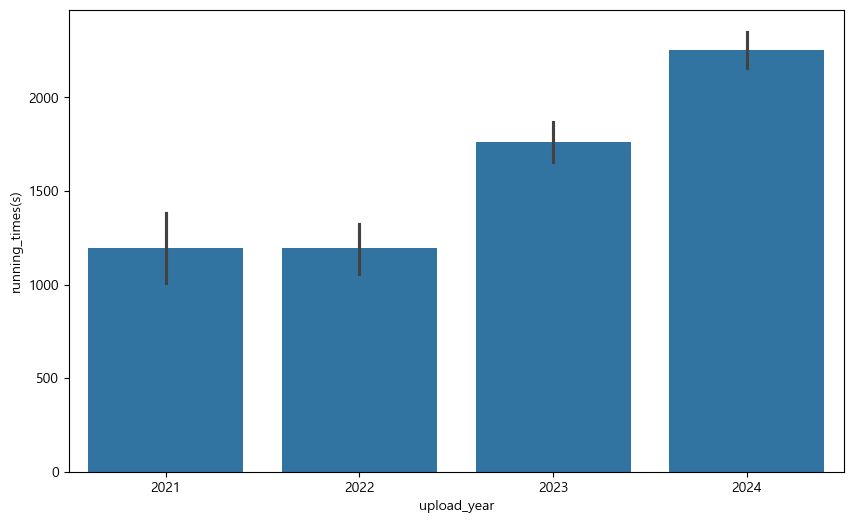

In [226]:
plt.figure(figsize=(10,6))
sns.barplot(x='upload_year', y='running_times(s)', data=contents_df_final, estimator='mean')
plt.show()

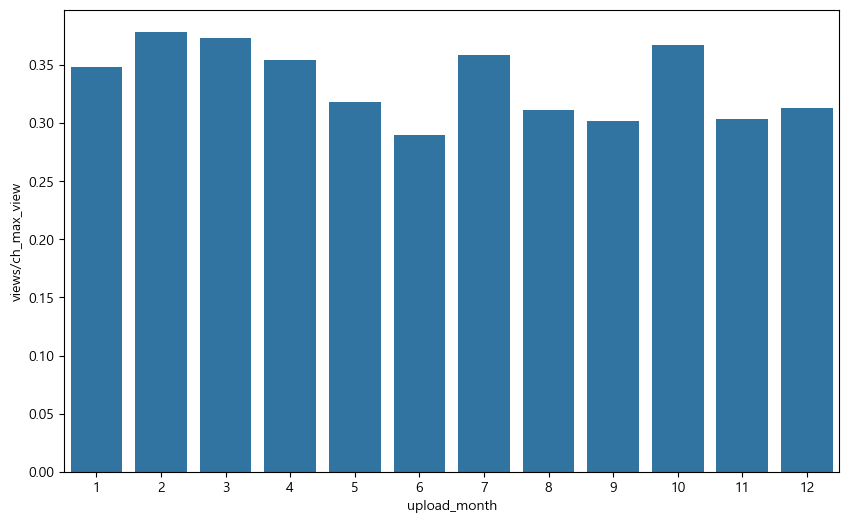

In [227]:
plt.figure(figsize=(10,6))
sns.barplot(x='upload_month', y='views/ch_max_view', data=contents_df_final, estimator='mean', errorbar=None)
plt.show()

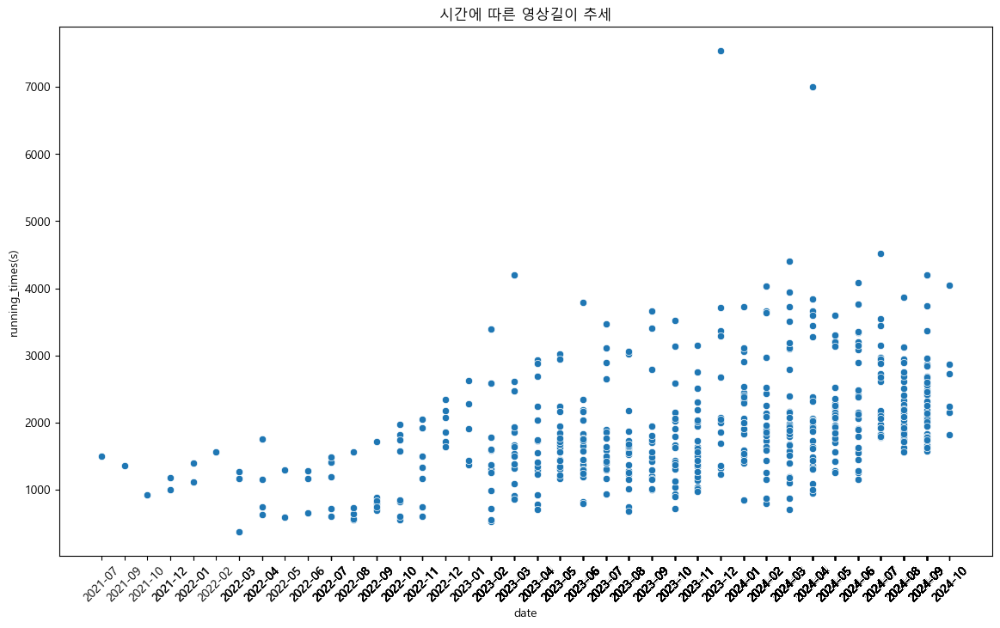

In [228]:
temp_df = contents_df_final.copy()
temp_df['date'] = temp_df['upload_year'].astype(str) + '-' + temp_df['upload_month'].astype(str).str.zfill(2)
temp_df = temp_df.sort_values('date')

plt.figure(figsize=(14,8))
sns.scatterplot(temp_df, x='date', y='running_times(s)')
plt.xticks(temp_df['date'], rotation=45)
plt.title('시간에 따른 영상길이 추세')
plt.show()


----

## 머신러닝 학습
- 조회수와 강한 상관 관계를 보이는 feature가 따로 없다고 판단되어 전체 feature를 사용.
- 좋아요, 댓글은 영상을 클릭한 이후에 할 수 있는 활동이므로 해당 새로운 영상 데이터를 넣는 경우 그 값을 지정할 수 없어 feature에서 제외하고 학습 및 예측 진행.
- label은 로그변환한 log_views 컬럼을 사용.

In [135]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor

# Ridge는 costfunction(에러 표현)에 가중치의 제곱을 더해 과적합 방지

- channel 원-핫 인코딩 추가 작업

In [136]:
encoder = OneHotEncoder()
encoded_channel = encoder.fit_transform(contents_df_final[['channel']])
encoded_channel

<530x13 sparse matrix of type '<class 'numpy.float64'>'
	with 530 stored elements in Compressed Sparse Row format>

In [137]:
encoded_columns = encoder.get_feature_names_out(['channel'])
encoded_array = encoded_channel.toarray()

encoded_df = pd.DataFrame(encoded_array, columns=encoded_columns)
contents_df_final_ML = pd.concat([contents_df_final, encoded_df], axis=1)

In [138]:
contents_df_final_ML.columns

Index(['channel', 'subscription', 'likes', 'views', 'upload_year',
       'upload_month', 'comment_count', 'running_times(s)', 'sex',
       'brand_power', 'entertainment', 'actor', 'comedian', 'singer',
       'arts_creator', 'sports', 'media_production', 'business_other', '10',
       '20', '30', '40', '50', '60', 'questions_per_minute',
       'title_script_related', 'z_score', 'views/ch_max_view', 'likes/views',
       'comment/views', 'man', 'woman', 'mix', 'log_views',
       'likes/subscription', 'comment_count/subscription', 'channel_김종국',
       'channel_노빠꾸탁재훈', 'channel_뜬뜬(핑계고)', 'channel_보듬TV', 'channel_살롱드립',
       'channel_요정재형', 'channel_일일칠', 'channel_재친구', 'channel_짠한형 신동엽',
       'channel_차린건 쥐뿔도 없지만', 'channel_채널십오야', 'channel_쿵 스튜디오', 'channel_혜리'],
      dtype='object')

In [139]:
contents_df_final_ML = contents_df_final_ML[['channel_김종국', 'channel_노빠꾸탁재훈', 'channel_뜬뜬(핑계고)', 'channel_보듬TV',
                                             'channel_살롱드립', 'channel_요정재형', 'channel_일일칠', 'channel_재친구',
                                             'channel_짠한형 신동엽', 'channel_차린건 쥐뿔도 없지만', 'channel_채널십오야',
                                             'channel_쿵 스튜디오', 'channel_혜리',
                                             'subscription',  'upload_year', 'upload_month', 'running_times(s)', 'brand_power',
                                             'entertainment', 'actor', 'comedian', 'singer', 'arts_creator',
                                             'sports', 'media_production', 'business_other', '10', '20', '30', '40',
                                             '50', '60', 'questions_per_minute', 'title_script_related',
                                             'log_views', 'man', 'woman', 'mix']]

In [140]:
contents_df_final_ML.head()

,channel_김종국,channel_노빠꾸탁재훈,channel_뜬뜬(핑계고),channel_보듬TV,channel_살롱드립,channel_요정재형,channel_일일칠,channel_재친구,channel_짠한형 신동엽,channel_차린건 쥐뿔도 없지만,...,30,40,50,60,questions_per_minute,title_script_related,log_views,man,woman,mix
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,3.3,0.036413,12.369318,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,2.7,0.090037,12.226409,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1,0,0,0,2.1,0.131204,12.456458,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,2.7,0.174963,13.316343,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,2,0,0,0,2.1,0.052299,12.563170,1.0,0.0,0.0


- brand power 원-핫 인코딩

In [141]:
# 인코딩 진행
encoded_bp = encoder.fit_transform(contents_df_final[['brand_power']])
encoded_bp

<530x3 sparse matrix of type '<class 'numpy.float64'>'
	with 530 stored elements in Compressed Sparse Row format>

In [142]:
encoded_columns = encoder.get_feature_names_out(['brand_power']) # 인코딩된 각 컬럼명 가져옴.
encoded_array = encoded_bp.toarray() # 각 데이터 배열로 변환

encoded_df = pd.DataFrame(encoded_array, columns=encoded_columns)
contents_df_final_ML = pd.concat([contents_df_final_ML, encoded_df], axis=1)

In [143]:
contents_df_final_ML.columns

Index(['channel_김종국', 'channel_노빠꾸탁재훈', 'channel_뜬뜬(핑계고)', 'channel_보듬TV',
       'channel_살롱드립', 'channel_요정재형', 'channel_일일칠', 'channel_재친구',
       'channel_짠한형 신동엽', 'channel_차린건 쥐뿔도 없지만', 'channel_채널십오야',
       'channel_쿵 스튜디오', 'channel_혜리', 'subscription', 'upload_year',
       'upload_month', 'running_times(s)', 'brand_power', 'entertainment',
       'actor', 'comedian', 'singer', 'arts_creator', 'sports',
       'media_production', 'business_other', '10', '20', '30', '40', '50',
       '60', 'questions_per_minute', 'title_script_related', 'log_views',
       'man', 'woman', 'mix', 'brand_power_상', 'brand_power_중',
       'brand_power_하'],
      dtype='object')

In [144]:
contents_df_final_ML = contents_df_final_ML[['channel_김종국', 'channel_노빠꾸탁재훈', 'channel_뜬뜬(핑계고)', 'channel_보듬TV',
                                             'channel_살롱드립', 'channel_요정재형', 'channel_일일칠', 'channel_재친구',
                                             'channel_짠한형 신동엽', 'channel_차린건 쥐뿔도 없지만', 'channel_채널십오야',
                                             'channel_쿵 스튜디오', 'channel_혜리',
                                             'subscription',  'upload_year', 'upload_month', 'running_times(s)',
                                             'brand_power_상', 'brand_power_중', 'brand_power_하',
                                             'entertainment', 'actor', 'comedian', 'singer', 'arts_creator',
                                             'sports', 'media_production', 'business_other', '10', '20', '30', '40',
                                             '50', '60', 'questions_per_minute', 'title_script_related',
                                             'log_views', 'man', 'woman', 'mix']]

In [145]:
contents_df_final_ML.head(5)

,channel_김종국,channel_노빠꾸탁재훈,channel_뜬뜬(핑계고),channel_보듬TV,channel_살롱드립,channel_요정재형,channel_일일칠,channel_재친구,channel_짠한형 신동엽,channel_차린건 쥐뿔도 없지만,...,30,40,50,60,questions_per_minute,title_script_related,log_views,man,woman,mix
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,3.3,0.036413,12.369318,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,2.7,0.090037,12.226409,1.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1,0,0,0,2.1,0.131204,12.456458,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0,0,0,0,2.7,0.174963,13.316343,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,2,0,0,0,2.1,0.052299,12.563170,1.0,0.0,0.0


In [146]:
X = contents_df_final_ML.drop(['log_views'], axis=1)
y = contents_df_final_ML['log_views']
y

0      12.369318
1      12.226409
2      12.456458
3      13.316343
4      12.563170
         ...    
525    13.501857
526    12.593123
527    13.584548
528    13.158107
529    15.169861
Name: log_views, Length: 530, dtype: float64

In [147]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)

### 모델 성능평가
- train과 test 데이터 간의 MSE 차이는 LinearRegression과 Ridge가 가장 적게 남.
- RandomForestRegressor는 test 데이터에 비해 train 데이터에 대한 성능이 너무 좋게나오므로 과적합의 위험이 있음.
- GradientBoostingRegressor가 test 데이터에 대한 설명력이 가장 좋으며 train 데이터에 대해 과적합으로 보이지는 않음.

[모델 선정]
- 상관관계에서 man과 woman이 0.7로 강한 상관 관계를 보여 다중 공선성을 최대한 피하기 위해 Ridge 모델 사용.
- GradientBoostingRegressor와 같은 트리모델은 다중 공선성에 영향을 덜받기에 해당 모델 사용.

In [43]:
models = [LinearRegression(), Ridge(), GradientBoostingRegressor(), RandomForestRegressor()]

for model in models:
    estimators = [
    ('scaler', StandardScaler()), # 첫번째 단계는 scaler(정규화) 인데 그건 standardscaler로
    ('clf', model) # 두번째 단계는 clf다
    ]

    pipe = Pipeline(estimators)
    pipe.fit(X_train, y_train)

    y_pred_train = pipe.predict(X_train)
    y_pred_test = pipe.predict(X_test)
    train_score = pipe.score(X_train, y_train)
    test_score = pipe.score(X_test, y_test)

    print(f'---- {model} ----')
    print('MSE Train Data: ', (mean_squared_error(y_train, y_pred_train)))
    print('MSE Test Data: ', (mean_squared_error(y_test, y_pred_test)))
    print('트레인 데이터 설명력(R²): ', train_score)
    print('테스트 데이터 설명력(R²): ', test_score)
    print('')

---- LinearRegression() ----
MSE Train Data:  0.27174836216172693
MSE Test Data:  0.3818281655668731
트레인 데이터 설명력(R²):  0.6887235106429397
테스트 데이터 설명력(R²):  0.6259248528102292

---- Ridge() ----
MSE Train Data:  0.2717462312796021
MSE Test Data:  0.3816114142312129
트레인 데이터 설명력(R²):  0.6887259514801236
테스트 데이터 설명력(R²):  0.626137203011452

---- GradientBoostingRegressor() ----
MSE Train Data:  0.11624000637942304
MSE Test Data:  0.39679372846600586
트레인 데이터 설명력(R²):  0.8668518889284217
테스트 데이터 설명력(R²):  0.6112631655668077

---- RandomForestRegressor() ----
MSE Train Data:  0.05005663143284101
MSE Test Data:  0.4350526805498636
트레인 데이터 설명력(R²):  0.9426622027175937
테스트 데이터 설명력(R²):  0.573781061252036



#### Ridge
- 파라미터를 다양하게 변경해도 성능 변화가 거의 없음.

In [243]:
from sklearn.model_selection import GridSearchCV

estimators = [
('scaler', StandardScaler()), # 첫번째 단계는 scaler(정규화) 인데 그건 standardscaler로
('ridge', Ridge())
]

param_grid = {
    'ridge__alpha': np.random.randint(1, 10, size=5),
    'ridge__max_iter': np.random.randint(100, 500, size=10),  # 반복 횟수 증가
    'ridge__solver': ['auto', 'svd', 'cholesky', 'lsqr'],  # 가중치 계산 방법
    'ridge__fit_intercept': [True, False]  # 절편 학습 여부 추가
}

pipe = Pipeline(estimators)
grid_search_R = GridSearchCV(pipe, param_grid, cv=5, scoring = 'neg_mean_squared_error') # 교차검증 5번

grid_search_R.fit(X_train, y_train)

# 최적의 파라미터 및 성능 출력
print("최적의 파라미터:", grid_search_R.best_params_)
print("최적의 교차검증 MSE:", grid_search_R.best_score_)

최적의 파라미터: {'ridge__alpha': 8, 'ridge__fit_intercept': True, 'ridge__max_iter': 228, 'ridge__solver': 'lsqr'}
최적의 교차검증 MSE: -0.3411200692078253


In [244]:
best_model_R = grid_search_R.best_estimator_
y_pred_train = best_model_R.predict(X_train)
y_pred_test = best_model_R.predict(X_test)
r2_train = best_model_R.score(X_train, y_train)
r2_test = best_model_R.score(X_test, y_test)

print('트레인 데이터 MSE:', (mean_squared_error(y_train, y_pred_train)))
print('테스트 데이터 MSE:', (mean_squared_error(y_test, y_pred_test)))
print(f"학습 데이터 설명력 (R²): {r2_train}")
print(f"테스트 데이터 설명력 (R²): {r2_test}")

트레인 데이터 MSE: 0.27227467861610005
테스트 데이터 MSE: 0.38209738290464346
학습 데이터 설명력 (R²): 0.6881206369516141
테스트 데이터 설명력 (R²): 0.6256611019287222


#### GradientBoostingRegressor
- n_estimators를 계속 증가시키니 트레인 데이터 점수는 좋아지는데 테스트 데이터 성능은 큰 변화가 없음. -> 그 결과 트레인데이터에 대한 과적합 발생으로 성능이 더 안좋아짐.
- 과적합을 막기위한 조치
    - learning_rate의 범위를 줄여 초기 학습량을 줄여서 과적합 방지(n_estimators도 이에 맞춰 어느정도 커야함.)
    - min_samples_split, min_samples_leaf의 최소 샘플수를 증가시켜 트리가 각 분할을 조금 더 신중하게 하도록 변경

- Best 파라미터 모델 찾기

In [245]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

results = []

for i in range(10):

    s = np.random.randint(1, 1000)
    # np.random.seed(s)

    estimators = [
    ('scaler', StandardScaler()), # 첫번째 단계는 scaler(정규화) 인데 그건 standardscaler로
    ('clf', GradientBoostingRegressor())
    ]

    param_distributions = {
        'clf__n_estimators': np.random.randint(100, 300, size=10),   # 결정 트리 개수
        'clf__learning_rate': np.random.uniform(0.01, 0.05, size=5),
        'clf__min_samples_split': np.random.randint(5, 20, size=5),  # 노드 분할을 위한 최소 샘플 수. 값이 작을수록 더 세분화된 학습
        'clf__min_samples_leaf': np.random.randint(5, 20, size=5),    # 리프 노드에서의 최소 샘플 수. 값이 작을수록 더 세분화된 학습
    }


    pipe = Pipeline(estimators)
    grid_search_G = RandomizedSearchCV(pipe, param_distributions,
                                n_iter=30,  # 랜덤으로 탐색할 조합 수,
                                cv=5,
                                scoring = 'neg_mean_squared_error',
                                random_state=s,
                                n_jobs=-1,
                                return_train_score=True  # train score를 포함하도록 설정
                                )

    grid_search_G.fit(X_train, y_train)

    results.append({
        'random_seed': s,
        'best_params': grid_search_G.best_params_,
        'mean_best_score(test_mse)': grid_search_G.best_score_,
        'train_score': grid_search_G.best_estimator_.score(X_train, y_train),
        'test_score': grid_search_G.best_estimator_.score(X_test, y_test),
        'diff_score': grid_search_G.best_estimator_.score(X_train, y_train) - grid_search_G.best_estimator_.score(X_test, y_test)
    })

results_df = pd.DataFrame(results).sort_values(by=('diff_score'), ascending=True)
results_df


,random_seed,best_params,mean_best_score(test_mse),train_score,test_score,diff_score
9,331,"{'clf__n_estimators': 179, 'clf__min_samples_s...",-0.350640,0.789496,0.614132,0.175364
2,464,"{'clf__n_estimators': 176, 'clf__min_samples_s...",-0.347311,0.806406,0.623128,0.183278
6,711,"{'clf__n_estimators': 227, 'clf__min_samples_s...",-0.348697,0.804468,0.620615,0.183853
3,550,"{'clf__n_estimators': 194, 'clf__min_samples_s...",-0.347221,0.807762,0.616329,0.191433
8,375,"{'clf__n_estimators': 265, 'clf__min_samples_s...",-0.354315,0.832969,0.636129,0.196840
1,324,"{'clf__n_estimators': 272, 'clf__min_samples_s...",-0.341405,0.830581,0.632638,0.197943
5,339,"{'clf__n_estimators': 241, 'clf__min_samples_s...",-0.346323,0.825736,0.624223,0.201513
0,136,"{'clf__n_estimators': 247, 'clf__min_samples_s...",-0.349927,0.840872,0.628222,0.212650
4,970,"{'clf__n_estimators': 247, 'clf__min_samples_s...",-0.346251,0.843253,0.626881,0.216372
7,591,"{'clf__n_estimators': 277, 'clf__min_samples_s...",-0.348130,0.846514,0.626473,0.220041


In [46]:
# 최적 모델 파라미터 추출
s_number = results_df.iloc[0]['random_seed']
best_params = {key.replace('clf__', ''): value for key, value in results_df.iloc[0]['best_params'].items()}

s_number, best_params

(18,
 {'learning_rate': 0.02344117457422641,
  'min_samples_leaf': 9,
  'min_samples_split': 5,
  'n_estimators': 245})

- Best 파라미터를 가지고 있는 시드로 모델 다시 생성

In [47]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

best_params['random_state'] = s_number

estimators = [
('scaler', StandardScaler()), # 첫번째 단계는 scaler(정규화) 인데 그건 standardscaler로
('clf', GradientBoostingRegressor(**best_params))
]


final_pipe = Pipeline(estimators)

# 최종 모델 학습
best_model_G = final_pipe.fit(X_train, y_train)

# 예측
y_pred_train = best_model_G.predict(X_train)
y_pred_test = best_model_G.predict(X_test)

# MSE 계산
mse_train = mean_squared_error(y_train, y_pred_train)
mse_test = mean_squared_error(y_test, y_pred_test)

# R² 계산
r2_train = best_model_G.score(X_train, y_train)
r2_test = best_model_G.score(X_test, y_test)

In [48]:
print("최종 모델에 사용된 파라미터:", best_model_G.named_steps['clf'].get_params())

최종 모델에 사용된 파라미터: {'alpha': 0.9, 'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.02344117457422641, 'loss': 'squared_error', 'max_depth': 3, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 9, 'min_samples_split': 5, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 245, 'n_iter_no_change': None, 'random_state': 18, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [49]:
print('트레인 데이터 MSE:', (mean_squared_error(y_train, y_pred_train)))
print('테스트 데이터 MSE:', (mean_squared_error(y_test, y_pred_test)))
print(f"학습 데이터 설명력 (R²): {r2_train}")
print(f"테스트 데이터 설명력 (R²): {r2_test}")

트레인 데이터 MSE: 0.18875139815364123
테스트 데이터 MSE: 0.398331861800118
학습 데이터 설명력 (R²): 0.7837930940553905
테스트 데이터 설명력 (R²): 0.6097562640198744


#### 핑계고, 덱스의 냉터뷰 조회수 예측해보기

(1) 핑계고

In [380]:
# 채널번호 확인
# df[df['title_text'].str.contains('핑계고')].head(1)

In [50]:
pinggaego_df = pd.read_csv('pinggaego_script.csv', index_col=0)

In [51]:
import re
question_cnt=[]

for script in pinggaego_df['script']:
    count=0
    sentences = re.findall(r'.*?\?', script)
    # print(len(sentences))    
    for sentence in sentences:
        # print(sentence)

        if 'you' in sentence.lower() and '?' in sentence:
                    count += 1
    question_cnt.append(count)

question_cnt
pinggaego_df['question_count'] = question_cnt
pinggaego_df

,script,title_text,question_count
0,"[""[36 second preview] Isn't it my third visit ...",[EN] 섬세한 I들은 핑계고ㅣEP.61,195


In [52]:
# from googletrans import Translator
from deep_translator import GoogleTranslator

def cal_similarity_df(df):
    translator = GoogleTranslator(src='ko', target='en')

    df['title_text_en'] = df['title_text'].apply(lambda x: translator.translate(x))

    tfidf = TfidfVectorizer()
    tfidf_matrix = tfidf.fit_transform(df['title_text_en'].tolist() + df['script'].tolist())

    # 유사도 비교 함수
    def cal_similarity(df):
        title_vec = tfidf.transform([df['title_text_en']])
        script_vec = tfidf.transform([df['script']])
        score = cosine_similarity(title_vec, script_vec)[0][0]
        
        return score

    # axis=1 행 단위로 함수 적용
    related_score = df.apply(cal_similarity, axis=1)

    df['title_script_related'] = related_score
    return df

In [56]:
cal_similarity_df(pinggaego_df)

,script,title_text,question_count,title_text_en,title_script_related
0,"[""[36 second preview] Isn't it my third visit ...",[EN] 섬세한 I들은 핑계고ㅣEP.61,195,[EN] Delicate I is excuses ㅣ EP.61,0.037691


In [57]:
X_train.columns

Index(['channel_김종국', 'channel_노빠꾸탁재훈', 'channel_뜬뜬(핑계고)', 'channel_보듬TV',
       'channel_살롱드립', 'channel_요정재형', 'channel_일일칠', 'channel_재친구',
       'channel_짠한형 신동엽', 'channel_차린건 쥐뿔도 없지만', 'channel_채널십오야',
       'channel_쿵 스튜디오', 'channel_혜리', 'subscription', 'upload_year',
       'upload_month', 'running_times(s)', 'brand_power_상', 'brand_power_중',
       'brand_power_하', 'entertainment', 'actor', 'comedian', 'singer',
       'arts_creator', 'sports', 'media_production', 'business_other', '10',
       '20', '30', '40', '50', '60', 'questions_per_minute',
       'title_script_related', 'man', 'woman', 'mix'],
      dtype='object')

In [58]:
# 핑계고 EP.61
X_data = pd.DataFrame([{
    'channel_김종국': 0,
    'channel_노빠꾸탁재훈': 0,
    'channel_뜬뜬(핑계고)': 1,
    'channel_보듬TV': 0,
    'channel_살롱드립': 0,
    'channel_요정재형': 0,
    'channel_일일칠': 0,
    'channel_재친구': 0,
    'channel_짠한형 신동엽': 0,
    'channel_차린건 쥐뿔도 없지만': 0,
    'channel_채널십오야': 0,
    'channel_쿵 스튜디오': 0,
    'channel_혜리': 0,
    'subscription': 2460000.0, 
    'upload_year': 2024, 
    'upload_month': 11,
    'running_times(s)': 3364,
    'brand_power_상': 1,
    'brand_power_중': 0,
    'brand_power_하': 0,
    'entertainment': 0,
    'actor': 1,
    'comedian': 1,
    'singer': 0,
    'arts_creator': 0,
    'sports': 0,
    'media_production': 0,
    'business_other': 0,
    '10': 0,
    '20': 0,
    '30': 2,
    '40': 1, 
    '50': 0, 
    '60': 0,
    'questions_per_minute': 3.5,
    'title_script_related': 0.07521,
    'man': 0, 
    'woman': 0, 
    'mix': 1
}])

X_data

,channel_김종국,channel_노빠꾸탁재훈,channel_뜬뜬(핑계고),channel_보듬TV,channel_살롱드립,channel_요정재형,channel_일일칠,channel_재친구,channel_짠한형 신동엽,channel_차린건 쥐뿔도 없지만,...,20,30,40,50,60,questions_per_minute,title_script_related,man,woman,mix
0,0,0,1,0,0,0,0,0,0,0,...,0,2,1,0,0,3.5,0.07521,0,0,1


In [59]:
predict_G = best_model_G.predict(X_data)[0]
predict_G

15.249843535907049

In [60]:
predict_views = int(round(np.exp(predict_G), 0))
diff = 5584562 - predict_views
print(f'실제 조회수: 5,584,562 \n예측 조회수: {predict_views:,}')
print(f'차이: {diff:,} \n오차 비율:{round((diff/5584562) * 100, 2)}%')

실제 조회수: 5,584,562 
예측 조회수: 4,196,845
차이: 1,387,717 
오차 비율:24.85%


(2) 덱스의 냉터뷰

In [395]:
# df[df['title_text'].str.contains('냉터뷰')].head(1)

In [61]:
dex_an_df = pd.read_csv('dex_an_script.csv', index_col=0)

In [62]:
import re
question_cnt=[]

for script in dex_an_df['script']:
    count=0
    sentences = re.findall(r'.*?\?', script)
    # print(len(sentences))    
    for sentence in sentences:
        # print(sentence)

        if 'you' in sentence.lower() and '?' in sentence:
                    count += 1
    question_cnt.append(count)

question_cnt
dex_an_df['question_count'] = question_cnt
dex_an_df

,script,title_text,question_count
0,"['Hello, I\'m Dex from ""Dex\'s Fridge Intervie...",[덱스의 냉터뷰] 엄마 얘네 또 싸워 l EP.25 안은진 편,191


In [63]:
cal_similarity_df(dex_an_df)

,script,title_text,question_count,title_text_en,title_script_related
0,"['Hello, I\'m Dex from ""Dex\'s Fridge Intervie...",[덱스의 냉터뷰] 엄마 얘네 또 싸워 l EP.25 안은진 편,191,[Dex's Coldter View] Moms fight again l Ep.25 ...,0.014901


In [64]:
# 냉터뷰 안은진 출현
X_data_dex_an = pd.DataFrame([{
    'channel_김종국': 0,
    'channel_노빠꾸탁재훈': 0,
    'channel_뜬뜬(핑계고)': 0,
    'channel_보듬TV': 0,
    'channel_살롱드립': 0,
    'channel_요정재형': 0,
    'channel_일일칠': 1,
    'channel_재친구': 0,
    'channel_짠한형 신동엽': 0,
    'channel_차린건 쥐뿔도 없지만': 0,
    'channel_채널십오야': 0,
    'channel_쿵 스튜디오': 0,
    'channel_혜리': 0, 
    'subscription': 490000.0, 
    'upload_year': 2024, 
    'upload_month': 10,
    'running_times(s)': 3194,
    'brand_power_상': 0,
    'brand_power_중': 1,
    'brand_power_하': 0,
    'entertainment': 0,
    'actor': 1,
    'comedian': 0,
    'singer': 0,
    'arts_creator': 0,
    'sports': 0,
    'media_production': 0,
    'business_other': 0,
    '10': 0,
    '20': 0,
    '30': 1,
    '40': 0, 
    '50': 0, 
    '60': 0,
    'questions_per_minute': 3.6,
    'title_script_related': 0.04584,
    'man': 0, 
    'woman': 1, 
    'mix': 0
}])

X_data_dex_an

,channel_김종국,channel_노빠꾸탁재훈,channel_뜬뜬(핑계고),channel_보듬TV,channel_살롱드립,channel_요정재형,channel_일일칠,channel_재친구,channel_짠한형 신동엽,channel_차린건 쥐뿔도 없지만,...,20,30,40,50,60,questions_per_minute,title_script_related,man,woman,mix
0,0,0,0,0,0,0,1,0,0,0,...,0,1,0,0,0,3.6,0.04584,0,1,0


In [65]:
predict_G = best_model_G.predict(X_data_dex_an)[0]
predict_G

14.218352756485285

In [66]:
dex_predict_views = int(round(np.exp(predict_G), 0))
diff = 1737929 - dex_predict_views
print(f'실제 조회수: 1,737,929 \n예측 조회수: {dex_predict_views:,}')
print(f'차이: {diff:,} \n오차 비율:{round((diff/1737929) * 100, 2)}%')

실제 조회수: 1,737,929 
예측 조회수: 1,496,071
차이: 241,858 
오차 비율:13.92%


## Review

- 연예인 게스트는 특히나 게스트가 누구냐에 따라 조회수의 편차가 굉장히 심하다. 즉 개인의 인지도 or 사회적 이슈 등 한 개인이 갖고 있는 영향력이 그 어떤 feature보다 중요한 특성으로 보인다. 하지만 이런 부분을 수치화하지 못해 조금 더 정교한 예측을 하기 어려운 부분이 있었다.
    - 실제로 30대 여성 배우인 권나라와 안은진 배우가 '덱스의 냉터뷰'에 각각 출현했을 때 이미 덱스와 케미를 쌓고 있던 안은진 배우가 출현한 영상의 조회수가 약 2배 정도 높았다.
- 파라미터를 아무리 다양하게 해도 모델의 설명력이 일정 수치에서 크게 벗어나지 않는다. 약 540개 정도의 데이터로 학습을 진행했지만 더 많은 데이터가 있었다면 모델의 설명력을 더 높일 수 있지 않았을까라는 생각을 하게 되었다.